# Recursive Deep Learning Framework
### There are three different strategies

### Imports

In [52]:
import pandas as pd
import numpy as np
import pickle
import os
import gc
import warnings
from collections import defaultdict

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Input
from tensorflow.keras.layers import Conv1D, Flatten, RepeatVector, TimeDistributed
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model

warnings.filterwarnings("ignore")

In [53]:
### Configuration
TARGET_VARIABLES = ['co2', 'gdp', 'primary_energy_consumption']
N_STEPS_IN = 5
N_STEPS_OUT = 3
# Setting test size as 9 samples
TEST_SAMPLES = 9
MAX_LAGS = 4

G20_COUNTRIES = [
    'United States', 'China', 'Japan', 'Germany', 
    'United Kingdom', 'France', 'Italy', 'Canada',
    'Brazil', 'Russia', 'India', 'Australia', 
    'Mexico', 'Indonesia', 'Turkey', 'Saudi Arabia',
    'South Africa', 'Argentina', 'South Korea'
]

FEATURES = [
    'fossil_fuel_consumption', 'energy_per_capita',
    'electricity_generation', 'population',
    'nuclear_consumption', 'renewables_consumption'
]

### Utility Functions

In [54]:
def clear_memory():
    tf.keras.backend.clear_session()
    gc.collect()

In [55]:
def rmse(y_pred, y_actual):
    return np.sqrt(mean_squared_error(y_actual, y_pred))

In [56]:
def mase(y_actual, y_pred, period=1):

    mae_forecast = mean_absolute_error(y_actual, y_pred)
    
    # MAE of naive forecast
    naive_forecast = y_actual[:-period] if period > 0 else y_actual[:-1]
    actual_for_naive = y_actual[period:] if period > 0 else y_actual[1:]
    
    if len(naive_forecast) == 0:
        return np.nan
    
    mae_naive = mean_absolute_error(actual_for_naive, naive_forecast)
    
    if mae_naive == 0:
        return 0 if mae_forecast == 0 else np.inf
    
    return mae_forecast / mae_naive

In [57]:
def pct_change_features(data):
    """
    This is to convert the series into the percentage change from the previous time step
    -> It will lead the data more stationary
    Avoiding NaN in the first row
    """
    data = data.copy()

    # Storing the original values for denormalisation
    original_values = {}

    # For each feature, calculate pct_change with lag1
    for feature in FEATURES + TARGET_VARIABLES:
        if feature in data.columns:
            # Store original values
            data[f'{feature}_original'] = data[feature].values.copy()
            
            # pct_change
            if f'{feature}_lag1' in data.columns:
                lag1_values = data[f'{feature}_lag1'].values
                current_values = data[feature].values

                # Create mask for non-zero lag values
                non_zero_mask = lag1_values != 0
                pct_change = np.zeros_like(current_values)
            
                # Calculate pct change only where lag1 is non-zero (curr - lag1) / lag1
                pct_change[non_zero_mask] = (current_values[non_zero_mask] - lag1_values[non_zero_mask]) / lag1_values[non_zero_mask]
                
                data[f'{feature}_pct'] = pct_change
    
    return data

In [58]:
def denormalise_pct_change(pct_preds, last_actual_value):
    """
    Conver pct_change preds back to the original scale
    value_t = value_{t-1} * (1 + pct_change_t)
    """
    actual_values = []
    curr_val = last_actual_value
    
    for pct in pct_preds:
        next_value = curr_val * (1 + pct)
        actual_values.append(next_value)
        curr_val = next_value
    
    return np.array(actual_values)

In [59]:
def prepare_features(data, features, target, use_lags=True):
    """
    Preparing feature matrix with lag features and pct changes
    """
    feature_cols = []

    all_features = features.copy()
    if target not in all_features:
        all_features.append(target)

    for feature in all_features:
        # Use the original column
        if feature in data.columns:
            feature_cols.append(feature)
        # Or use the _pct column if it exists
        elif f'{feature}_pct' in data.columns:
            feature_cols.append(f'{feature}_pct')

        # Lag features
        if use_lags:
            for lag in range(1, 5):
                lag_col = f'{feature}_lag{lag}'

                if lag_col in data.columns:
                    # Calculate pct change for lag features
                    if lag < 4:
                        next_lag = f'{feature}_lag{lag+1}'
                        if next_lag in data.columns:
                            lag_values = data[lag_col].values
                            next_lag_values = data[next_lag].values
                            
                            non_zero_mask = next_lag_values != 0
                            pct_lag = np.zeros_like(lag_values)
                            pct_lag[non_zero_mask] = (lag_values[non_zero_mask] - next_lag_values[non_zero_mask]) / next_lag_values[non_zero_mask]
                            
                            pct_lag_col = f'{feature}_lag{lag}_pct'
                            data[pct_lag_col] = pct_lag
                            feature_cols.append(pct_lag_col)
    
    if f'{target}_pct' in data.columns:
        target_col = f'{target}_pct'
    else:
        target_col = target
    
    return data, feature_cols, target_col

### Data Load

In [60]:
def load_data(save_dir='data_export'):
    lag_path = os.path.join(save_dir, 'lag_df_1965.pkl')
    lag_df = pd.read_pickle(lag_path)
    print(f"Data Shape: {lag_df.shape}")
    return lag_df

### Model builds

In [61]:
def build_lstm(input_shape, output_shape, hidden=32):
    model = Sequential([
        LSTM(hidden, activation='relu', input_shape=input_shape, kernel_regularizer=l2(0.01)),
        Dense(output_shape)
    ])
    model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mae'])
    return model

In [62]:
def build_bilstm(input_shape, output_shape, hidden=16):
    model = Sequential([
        Bidirectional(LSTM(hidden, activation='relu', kernel_regularizer=l2(0.001), recurrent_regularizer=l2(0.01)),
                      input_shape=input_shape),
        Dense(output_shape)
    ])
    model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mae'])
    return model

In [63]:
def build_edlstm(input_shape, output_shape, hidden=16):
    model = Sequential([
        LSTM(hidden, activation='relu', input_shape=input_shape, kernel_regularizer=l2(0.01)),
        RepeatVector(output_shape),
        LSTM(hidden, activation='relu', return_sequences=True, kernel_regularizer=l2(0.01)),
        TimeDistributed(Dense(1))
    ])
    model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mae'])
    return model

In [64]:
def build_cnn(input_shape, output_shape, filters=32, hidden=16):
    model = Sequential([
        Conv1D(filters=filters, kernel_size=3, activation='relu', input_shape=input_shape, padding='same', kernel_regularizer=l2(0.01)),
        Flatten(),
        Dense(hidden, activation='relu', kernel_regularizer=l2(0.01)),
        Dense(output_shape)
    ])
    model.compile(optimizer=Adam(learning_rate=0.01), loss='mse', metrics=['mae'])
    return model

In [65]:
def build_multioutput_model(input_shape, n_features, output_steps, hidden=16):
    """
    This model predicts both Y and X features
    """
    inputs = Input(shape=input_shape)

    # LSTM process
    lstm_out = LSTM(hidden, activation='relu', return_sequences=False)(inputs)

    # Output for target
    y_output = Dense(output_steps, name='y_output')(lstm_out)

    # Output for features
    x_output_flat = Dense(output_steps * n_features, name='x_output')(lstm_out)
    x_output = tf.keras.layers.Reshape((output_steps, n_features), name='x_reshape')(x_output_flat)
    
    model = Model(inputs=inputs, outputs=[y_output, x_output])

    model.compile(
        optimizer=Adam(learning_rate=0.01),
        loss={'y_output': 'mse', 'x_output': 'mse'},
        loss_weights={'y_output': 1.0, 'x_output': 0.5}, # More weights for y_output
        metrics={'y_output': 'mae', 'x_output': 'mae'}
    )
    return model

### LOCO
Leave One Country Out

In [66]:
class LOCOForecaster:
    def __init__(self, model_func, input_steps=N_STEPS_IN, output_steps=N_STEPS_OUT):
        self.model_func = model_func
        self.input_steps = input_steps
        self.output_steps = output_steps
        self.model = None
        self.X_scaler = StandardScaler()
        self.y_scaler = StandardScaler()
        self.is_trained = False
        self.n_features = None
        self.all_predictions_scaled = []

    def create_sequences(self, X, y):
        if len(X) < self.input_steps +self.output_steps:
            return np.array([]), np.array([])
        
        X_seq = []
        y_seq = []

        for i in range(len(X) - self.input_steps - self.output_steps + 1):
            X_seq.append(X[i:i + self.input_steps])
            y_seq.append(y[i + self.input_steps:i + self.input_steps + self.output_steps])
        
        X_seq = np.array(X_seq)
        y_seq = np.array(y_seq)

        # Check shapes
        if len(X_seq) > 0 and len(X_seq.shape) == 2:
            X_seq = X_seq.reshape(len(X_seq), self.input_steps, -1)

        if len(y_seq) > 0 and len(y_seq.shape) == 1:
            y_seq = y_seq.reshape(len(y_seq), self.output_steps)
        
        return X_seq, y_seq
    
    def train_model(self, X_train, y_train):
        self.n_features = X_train.shape[1]

        # Scaling
        X_train_scaled = self.X_scaler.fit_transform(X_train)
        y_train_scaled = self.y_scaler.fit_transform(y_train.reshape(-1, 1)).ravel()
        
        # Seq
        X_train_seq, y_train_seq = self.create_sequences(X_train_scaled, y_train_scaled)
        
        if len(X_train_seq) == 0:
            print(f"Not enough data to create sequences")
            return
        
        print(f"Training sequences: {len(X_train_seq)}")

        # Model build
        input_shape = (self.input_steps, self.n_features)
        self.model = self.model_func(input_shape, self.output_steps)

        # Earlystopping
        callbacks = [EarlyStopping(monitor='loss', patience=20, restore_best_weights=True)]        

        # Batch size
        batch_size = min(16, len(X_train_seq))

        self.model.fit(
            X_train_seq, y_train_seq,
            epochs=100,
            batch_size=batch_size,
            callbacks=callbacks,
            verbose=0
        )

        self.is_trained = True

    def calculate_metrics(self, predictions, actuals, interation_num):
        
        if len(predictions) == 0 or len(actuals) == 0:
            return {'iteration': interation_num, 'rmse': np.nan, 'mase': np.nan}
        
        rmse_val = rmse(predictions, actuals)
        mase_val = mase(actuals, predictions)
        return {'iteration': interation_num, 'rmse': rmse_val, 'mase': mase_val}

    def non_recursive_forecast(self, X_train, y_train, X_test, y_test, y_train_original=None, y_test_original=None):
        if not self.is_trained:
            print("Model not trained")
            return None
        
        # Scale
        X_train_scaled = self.X_scaler.transform(X_train)
        X_test_scaled = self.X_scaler.transform(X_test)
        
        predictions_pct = []
        actuals_pct = []
        predictions_actual = []
        actuals_actual = []
        iterations = []
        metrics_list = []

        # Iteration
        for iteration in range(3):
            if iteration == 0:
                X_window = X_train_scaled[-5:]
                start_idx = 0
                print(f"    Iter {iteration}: Using last 5 train values")
            elif iteration == 1:
                X_window = np.vstack([X_train_scaled[-2:], X_test_scaled[0:3]])
                start_idx = 3
                print(f"    Iter {iteration}: Using last 2 train + test[0:3]")
            elif iteration == 2:
                X_window = X_test_scaled[1:6]
                start_idx = 6
                print(f"    Iter {iteration}: Using test[1:6]")

            X_input = X_window.reshape(1, self.input_steps, -1)

            # Predict
            y_pred_scaled = self.model.predict(X_input, verbose=0)
            # ED-LSTM
            if len(y_pred_scaled.shape) == 3:
                y_pred_scaled = y_pred_scaled.reshape(-1)

            # y_pred_scaled is 1D
            y_pred_scaled = y_pred_scaled.flatten()

            # Inverse back to pct_change
            y_pred_pct = self.y_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()

            # Actual values
            end_idx = min(start_idx + self.output_steps, len(y_test))
            y_actual_pct = y_test[start_idx:end_idx]

            # Convert back to actual values from pct_change
            if y_test_original is not None and y_train_original is not None:
                if iteration == 0:
                    # Use last training value
                    last_known_value = y_train_original[-1]
                else:
                    # Use last actual value from test
                    last_known_value = y_test_original[start_idx - 1]

                # Convert preds to actual values
                y_pred_actual = denormalise_pct_change(y_pred_pct[:len(y_actual_pct)], last_known_value)
                y_actual_actual = y_test_original[start_idx:end_idx]

                if len(y_actual_actual) == len(y_pred_actual):
                    predictions_actual.extend(y_pred_actual)
                    actuals_actual.extend(y_actual_actual)

                    # Metrics
                    metrics = self.calculate_metrics(y_pred_actual, y_actual_actual, iteration)
                else:
                    metrics = self.calculate_metrics(y_pred_pct[:len(y_actual_pct)], y_actual_pct, iteration)
            else:
                metrics = self.calculate_metrics(y_pred_pct[:len(y_actual_pct)], y_actual_pct, iteration)
            
            predictions_pct.extend(y_pred_pct)
            actuals_pct.extend(y_actual_pct)
            iterations.extend([iteration] * len(y_pred_pct))
            metrics_list.append(metrics)
            print(f"    RMSE: {metrics['rmse']:.4f}, MASE: {metrics['mase']:.4f}")
        
        results = {
            'predictions_pct': np.array(predictions_pct),
            'actuals_pct': np.array(actuals_pct),
            'iterations': np.array(iterations),
            'metrics': pd.DataFrame(metrics_list)
        }

        if len(predictions_actual) > 0:
            results['predictions_actual'] = np.array(predictions_actual)
            results['actuals_actual'] = np.array(actuals_actual)
        
        return results


    def recursive_forecast(self, X_train, y_train, X_test, y_test, y_train_original=None, y_test_original=None):
        if not self.is_trained:
            print(f"Model not trained")
            return None
        
        # Scale data
        X_train_scaled = self.X_scaler.transform(X_train)
        X_test_scaled = self.X_scaler.transform(X_test)
        
        predictions_pct = []
        actuals_pct = []
        predictions_actual = []
        actuals_actual = []
        iterations = []
        metrics_list = []

        # Store preds
        all_pred_windows = []

        for iteration in range(3):
            if iteration == 0:
                X_window = X_train_scaled[-5:]
                start_idx = 0
                print(f"    Iter {iteration}: Using last 5 training values")
            elif iteration == 1:
                if len(all_pred_windows) >= 3:
                    pred_window = np.array(all_pred_windows[0:3])
                    X_window = np.vstack([X_train_scaled[-2:], pred_window])
                    start_idx = 3
                    print(f"    Iter {iteration}: Using last 2 training + pred[0:3]")
                else:
                    print(f"    ERROR: Not enough predictions from previous iteration")
                    break
            elif iteration == 2:
                if len(all_pred_windows) >= 6:
                    X_window = np.array(all_pred_windows[1:6])
                    start_idx = 6
                    print(f"    Iter {iteration}: Using pred[1:6]")
                else:
                    print(f"    ERROR: Not enough preds for window (have {len(all_pred_windows)}, need 6)")
                    break
            
            X_input = X_window.reshape(1, self.input_steps, -1)

            # Predict
            y_pred_scaled = self.model.predict(X_input, verbose=0)
            # ED-LSTM
            if len(y_pred_scaled.shape) == 3:
                y_pred_scaled = y_pred_scaled.reshape(-1)

            # Ensure y_pred_scaled is 1D
            y_pred_scaled = y_pred_scaled.flatten()

            # Store preds and synthetic vectors with pred as first feature
            for i in range(self.output_steps):
                pred_features = np.zeros(self.n_features)

                pred_value = float(y_pred_scaled[i]) if np.isscalar(y_pred_scaled[i]) else float(y_pred_scaled[i].item())
                pred_features[0] = pred_value

                test_position = start_idx + i
                if test_position < len(X_test_scaled):
                    # Copy other features from test data
                    pred_features[1:] = X_test_scaled[test_position, 1:]
                else:
                    # Use last known features
                    pred_features[1:] = X_test_scaled[-1, 1:]

                all_pred_windows.append(pred_features)
            
            # Inverse transform to pct change
            y_pred_pct = self.y_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).ravel()
            
            # Actual values for this iteration
            end_idx = min(start_idx + self.output_steps, len(y_test))
            y_actual_pct = y_test[start_idx:end_idx]
            
            # Convert back to actual values
            if y_test_original is not None and y_train_original is not None:
                if iteration == 0:
                    last_known_value = y_train_original[-1]
                else:
                    last_known_value = predictions_actual[-1] if len(predictions_actual) > 0 else y_train_original[-1]
                
                # Convert preds back to actual values
                y_pred_actual = denormalise_pct_change(y_pred_pct[:len(y_actual_pct)], last_known_value)
                y_actual_actual = y_test_original[start_idx:end_idx]
                
                if len(y_actual_actual) == len(y_pred_actual):
                    predictions_actual.extend(y_pred_actual)
                    actuals_actual.extend(y_actual_actual)
                    
                    # Metrics
                    metrics = self.calculate_metrics(y_pred_actual, y_actual_actual, iteration)
                else:
                    metrics = self.calculate_metrics(y_pred_pct[:len(y_actual_pct)], y_actual_pct, iteration)
            else:
                metrics = self.calculate_metrics(y_pred_pct[:len(y_actual_pct)], y_actual_pct, iteration)
            
            predictions_pct.extend(y_pred_pct)
            actuals_pct.extend(y_actual_pct)
            iterations.extend([iteration] * len(y_pred_pct))
            metrics_list.append(metrics)
            
            print(f"    RMSE: {metrics['rmse']:.4f}, MASE: {metrics['mase']:.4f}")
        
        results = {
            'predictions_pct': np.array(predictions_pct),
            'actuals_pct': np.array(actuals_pct),
            'iterations': np.array(iterations),
            'metrics': pd.DataFrame(metrics_list)
        }
        
        if len(predictions_actual) > 0:
            results['predictions_actual'] = np.array(predictions_actual)
            results['actuals_actual'] = np.array(actuals_actual)
        
        return results

In [67]:
class LOCOComparison:    
    def __init__(self, countries, features, target):
        self.countries = countries
        self.features = features
        self.target = target
    
    def run_comparison(self, data, test_country, model_func=build_lstm):
        print(f"Leave-One-Country-Out Comparison for: {test_country}")
        
        # Apply percentage change features
        data = pct_change_features(data)
        
        # Split countries
        train_countries = [c for c in self.countries if c != test_country]
        
        # Prepare training data from all other countries
        X_train_list = []
        y_train_list = []
        y_train_original_list = []
        
        for country in train_countries:
            country_data = data[data['country'] == country].sort_values('year')
            
            country_data, feature_cols, target_col = prepare_features(country_data, self.features, self.target, use_lags=True)
            
            original_target_col = f'{self.target}_original'
            
            valid_cols = feature_cols + [target_col]
            if original_target_col in country_data.columns:
                valid_cols.append(original_target_col)
            
            valid_data = country_data[valid_cols].dropna()
            
            if len(valid_data) > 0:
                X = valid_data[feature_cols].values
                y = valid_data[target_col].values
                y_original = valid_data[original_target_col].values if original_target_col in valid_data.columns else None
                
                # Use all data from other countries for training
                X_train_list.append(X)
                y_train_list.append(y)
                
                if y_original is not None:
                    y_train_original_list.append(y_original)
        
        # Combine training data
        X_train_all = np.vstack(X_train_list) if X_train_list else np.array([])
        y_train_all = np.hstack(y_train_list) if y_train_list else np.array([])
        y_train_original_all = np.hstack(y_train_original_list) if y_train_original_list else None
        
        if len(X_train_all) == 0:
            print("No training data available")
            return None
        
        print(f"Total training samples from other countries: {len(X_train_all)}")
        
        # Test country data
        test_data = data[data['country'] == test_country].sort_values('year')
        test_data, feature_cols, target_col = prepare_features(test_data, self.features, self.target, use_lags=True)
        
        original_target_col = f'{self.target}_original'
        test_valid_cols = feature_cols + [target_col]
        if original_target_col in test_data.columns:
            test_valid_cols.append(original_target_col)
        
        test_valid = test_data[test_valid_cols].dropna()
        
        if len(test_valid) == 0:
            print(f"No valid data for test country {test_country}")
            return None
        
        # Split country data
        n_test_country_samples = len(test_valid)
        n_test = TEST_SAMPLES
        n_train = n_test_country_samples - n_test
        
        if n_train < N_STEPS_IN:
            print(f"Not enough training data for {test_country}")
            return None
        
        # Features and targets
        X_test_country = test_valid[feature_cols].values
        y_test_country = test_valid[target_col].values
        y_test_country_original = test_valid[original_target_col].values if original_target_col in test_valid.columns else None
        
        # Split into train/test for the test country
        X_train_from_test = X_test_country[:n_train]
        y_train_from_test = y_test_country[:n_train]
        y_train_from_test_original = y_test_country_original[:n_train] if y_test_country_original is not None else None
        
        X_test = X_test_country[n_train:n_train + n_test]
        y_test = y_test_country[n_train:n_train + n_test]
        y_test_original = y_test_country_original[n_train:n_train + n_test] if y_test_country_original is not None else None
        
        print(f"Test country train samples: {len(X_train_from_test)}")
        print(f"Test country test samples: {len(X_test)}")
        
        forecaster = LOCOForecaster(model_func)
        
        # Train model on all other countries' data
        forecaster.train_model(X_train_all, y_train_all)
        
        # Run both experiments
        results = {}
        
        # Non-recursive forecasting
        non_recursive_results = forecaster.non_recursive_forecast(
            X_train_from_test, y_train_from_test,
            X_test, y_test,
            y_train_from_test_original, y_test_original
        )
        if non_recursive_results is not None:
            results['non_recursive'] = non_recursive_results
        
        # Recursive forecasting
        recursive_results = forecaster.recursive_forecast(
            X_train_from_test, y_train_from_test,
            X_test, y_test,
            y_train_from_test_original, y_test_original
        )
        if recursive_results is not None:
            results['recursive'] = recursive_results
        
        self.print_summary(results, test_country)
        
        return results
    
    def print_summary(self, results, country):
        print(f"\nSummary for {country}")
        
        for strategy in ['non_recursive', 'recursive']:
            if strategy in results:
                res = results[strategy]
                
                if 'predictions_actual' in res and len(res['predictions_actual']) > 0:
                    preds = res['predictions_actual']
                    acts = res['actuals_actual']
                    data_type = "(actual values)"
                else:
                    preds = res['predictions_pct']
                    acts = res['actuals_pct']
                    data_type = "(% change)"
                
                if len(preds) > 0:
                    overall_rmse = rmse(preds, acts)
                    overall_mase = mase(acts, preds)
                    
                    strategy_name = "Non-Recursive" if strategy == 'non_recursive' else "Recursive"
                    print(f"\n{strategy_name} {data_type}:")
                    print(f"  Overall RMSE: {overall_rmse:.4f}")
                    print(f"  Overall MASE: {overall_mase:.4f}")
                    print(f"  Predictions made: {len(preds)}")

### Single Country

In [68]:
class SingleCountryModel:
    def __init__(self, features, target):
        self.features = features
        self.target = target

    def run_single_country(self, data, country, model_func=build_lstm):
        print(f"\nSingle Country Model for {country}")

        data = pct_change_features(data)

        country_data = data[data['country'] == country].sort_values('year')

        country_data, feature_cols, target_col = prepare_features(country_data, self.features, self.target, use_lags=True)

        original_target_col = f'{self.target}_original'

        valid_cols = feature_cols + [target_col]
        if original_target_col in country_data.columns:
            valid_cols.append(original_target_col)

        valid_data = country_data[valid_cols].dropna()

        if len(valid_data) == 0:
            print(f"No valid data for {country}")
            return None
        
        # Split
        n_samples = len(valid_data)
        n_test = TEST_SAMPLES
        n_train = n_samples - n_test

        if n_train < N_STEPS_IN + N_STEPS_OUT:
            print(f"Not enough training data for {country}")
            return None

        X = valid_data[feature_cols].values
        y = valid_data[target_col].values
        y_original = valid_data[original_target_col].values if original_target_col in valid_data.columns else None
        
        X_train = X[:n_train]
        y_train = y[:n_train]
        y_train_original = y_original[:n_train] if y_original is not None else None
        
        X_test = X[n_train:n_train + n_test]
        y_test = y[n_train:n_train + n_test]
        y_test_original = y_original[n_train:n_train + n_test] if y_original is not None else None
        
        print(f"Training samples: {len(X_train)}")
        print(f"Test samples: {len(X_test)}")

        forecaster = LOCOForecaster(model_func)
        
        forecaster.train_model(X_train, y_train)
        
        results = {}
        
        # Non-recursive forecasting
        non_recursive_results = forecaster.non_recursive_forecast(
            X_train, y_train,
            X_test, y_test,
            y_train_original, y_test_original
        )
        if non_recursive_results is not None:
            results['non_recursive'] = non_recursive_results
        
        # Recursive forecasting
        recursive_results = forecaster.recursive_forecast(
            X_train, y_train,
            X_test, y_test,
            y_train_original, y_test_original
        )
        if recursive_results is not None:
            results['recursive'] = recursive_results
        
        # Print summary
        self.print_summary(results, country)
        
        return results
    
    def print_summary(self, results, country):
        print(f"\nSingle Country Summary for {country}")

        for strategy in ['non_recursive', 'recursive']:
            if strategy in results:
                res = results[strategy]

                if 'predictions_actual' in res and len(res['predictions_actual']) > 0:
                    preds = res['predictions_actual']
                    acts = res['actuals_actual']
                    data_type = "(actual values)"
                else:
                    preds = res['predictions_pct']
                    acts = res['actuals_pct']
                    data_type = "(% change)"
                
                if len(preds) > 0:
                    overall_rmse = rmse(preds, acts)
                    overall_mase = mase(acts, preds)
                    
                    strategy_name = "Non-Recursive" if strategy == 'non_recursive' else "Recursive"
                    print(f"\n{strategy_name} {data_type}:")
                    print(f"  Overall RMSE: {overall_rmse:.4f}")
                    print(f"  Overall MASE: {overall_mase:.4f}")
                    print(f"  Predictions made: {len(preds)}")

### Visualisation

In [69]:
def plot_model_comparison(results, country, target, save_dir='data_export', use_actual_values=True):
    os.makedirs(os.path.join(save_dir, '04_plots'), exist_ok=True)
    
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(f'{country} - {target}: LOCO vs Single Country Model Comparison', fontsize=16, y=1)
    
    model_types = ['loco', 'single']
    model_labels = ['Leave-One-Country-Out', 'Single Country']
    strategies = ['non_recursive', 'recursive']
    
    for model_idx, (model_type, model_label) in enumerate(zip(model_types, model_labels)):
        if model_type not in results:
            continue
        
        for strat_idx, strategy in enumerate(strategies):
            if strategy not in results[model_type]:
                continue

            strategy_results = results[model_type][strategy]

            if use_actual_values and 'predictions_actual' in strategy_results and len(strategy_results['predictions_actual']) > 0:
                predictions = strategy_results['predictions_actual']
                actuals = strategy_results['actuals_actual']
                value_label = f'{target} (Actual Values)'
            else:
                predictions = strategy_results['predictions_pct']
                actuals = strategy_results['actuals_pct']
                value_label = f'{target} (% Change)'
        
            # Plot predictions vs actuals
            ax1 = axes[model_idx, strat_idx * 2]
            ax1.plot(actuals, label='Actual', alpha=0.8, linewidth=2, color='blue')
            ax1.plot(predictions, label='Predicted', alpha=0.8, linewidth=2, color='orange')
            
            strategy_name = 'Non-Recursive' if strategy == 'non_recursive' else 'Recursive'
            ax1.set_title(f'{model_label} - {strategy_name}')
            ax1.set_xlabel('Time Step')
            ax1.set_ylabel(value_label)
            ax1.legend(loc='upper left')
            
            if len(predictions) >= 3:
                ax1.axvline(x=2.5, color='gray', linestyle=':', alpha=0.3)
            if len(predictions) >= 6:
                ax1.axvline(x=5.5, color='gray', linestyle=':', alpha=0.3)
            
            # Calculate residuals
            residuals = predictions - actuals
            
            # Plot residuals
            ax2 = axes[model_idx, strat_idx * 2 + 1]
            colors = ['red' if r > 0 else 'blue' for r in residuals]
            ax2.bar(range(len(residuals)), residuals, alpha=0.7, color=colors)
            ax2.axhline(y=0, color='black', linestyle='--', alpha=0.5)
            ax2.set_title(f'Residuals - {strategy_name}')
            ax2.set_xlabel('Time Step')
            ax2.set_ylabel('Prediction Error')
            
            # Add RMSE per iteration as bar chart
            metrics_df = strategy_results['metrics']
            if not metrics_df.empty:
                # Create inset axes for RMSE bars
                inset_ax = ax2.inset_axes([0.6, 0.6, 0.35, 0.35])
                inset_ax.bar(metrics_df['iteration'], metrics_df['rmse'], color='coral', alpha=0.7)
                inset_ax.set_xlabel('Iter', fontsize=8)
                inset_ax.set_ylabel('RMSE', fontsize=8)
                inset_ax.tick_params(labelsize=6)
            
            # Add overall metrics as text
            if len(predictions) > 0:
                overall_rmse = rmse(predictions, actuals)
                overall_mase = mase(actuals, predictions)
                
                metrics_text = f'RMSE: {overall_rmse:.4f}\nMASE: {overall_mase:.4f}'
                ax1.text(0.02, 0.98, metrics_text, transform=ax1.transAxes, va='top', ha='left',
                        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7),
                        fontsize=9)
    
    plt.tight_layout()
    
    # Save plot
    plot_path = os.path.join(save_dir, '04_plots', f'{country}_{target}_model_comparison.png')
    plt.savefig(plot_path, dpi=150, bbox_inches='tight')
    
    return fig

In [70]:
def plot_comparison_summary(summary_df, target, save_dir='data_export'):
    os.makedirs(os.path.join(save_dir, '04_plots'), exist_ok=True)
    
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle(f'Model Comparison Summary - Target: {target}', fontsize=14)
    
    summary_pivot = summary_df.pivot_table(
        index=['country', 'strategy'],
        columns='model_type',
        values='rmse',
        aggfunc='mean'
    ).reset_index()
    
    # Plot 1: RMSE comparison by country and strategy
    ax1 = axes[0]
    
    countries = summary_df['country'].unique()
    strategies = ['non_recursive', 'recursive']
    
    x = np.arange(len(countries))
    width = 0.3
    
    for i, strategy in enumerate(strategies):
        strategy_data = summary_df[summary_df['strategy'] == strategy]
        
        loco_rmse = []
        single_rmse = []
        
        for country in countries:
            loco_val = strategy_data[(strategy_data['country'] == country) & 
                                   (strategy_data['model_type'] == 'loco')]['rmse'].values
            single_val = strategy_data[(strategy_data['country'] == country) & 
                                     (strategy_data['model_type'] == 'single')]['rmse'].values
            
            loco_rmse.append(loco_val[0] if len(loco_val) > 0 else 0)
            single_rmse.append(single_val[0] if len(single_val) > 0 else 0)
        
        offset = width * (i - 0.5)
        
        bars1 = ax1.bar(x + offset - width/2, loco_rmse, width/2, 
                        label=f'LOCO {strategy.replace("_", "-")}',
                        alpha=0.8, color='blue' if i == 0 else 'darkblue')
        bars2 = ax1.bar(x + offset + width/2, single_rmse, width/2,
                        label=f'Single {strategy.replace("_", "-")}',
                        alpha=0.8, color='orange' if i == 0 else 'darkorange')
    
    ax1.set_xlabel('Country')
    ax1.set_ylabel('RMSE')
    ax1.set_title('RMSE Comparison by Country and Strategy')
    ax1.set_xticks(x)
    ax1.set_xticklabels(countries, rotation=45, ha='right')
    ax1.legend(loc='upper left', fontsize=9)
    
    # Plot 2: Percentage improvement of LOCO over Single Country
    ax2 = axes[1]
    
    improvement_data = []
    
    for country in countries:
        for strategy in strategies:
            loco_data = summary_df[(summary_df['country'] == country) & 
                                 (summary_df['strategy'] == strategy) & 
                                 (summary_df['model_type'] == 'loco')]
            single_data = summary_df[(summary_df['country'] == country) & 
                                    (summary_df['strategy'] == strategy) & 
                                    (summary_df['model_type'] == 'single')]
            
            if not loco_data.empty and not single_data.empty:
                loco_rmse = loco_data['rmse'].values[0]
                single_rmse = single_data['rmse'].values[0]
                
                # Percentage improvement (positive means LOCO is better)
                improvement = ((single_rmse - loco_rmse) / single_rmse) * 100
                
                improvement_data.append({
                    'country': country,
                    'strategy': strategy.replace('_', '-'),
                    'improvement': improvement
                })
    
    if improvement_data:
        improvement_df = pd.DataFrame(improvement_data)
        
        # Grouped bar chart
        improvement_pivot = improvement_df.pivot(
            index='country',
            columns='strategy',
            values='improvement'
        )
        
        improvement_pivot.plot(kind='bar', ax=ax2, width=0.7, alpha=0.8,
                               color=['green', 'darkgreen'])
        
        ax2.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
        ax2.set_xlabel('Country')
        ax2.set_ylabel('Improvement (%)')
        ax2.set_title('LOCO Performance vs Single Country Model\n(Positive = LOCO Better)')
        ax2.legend(title='Strategy', loc='upper right')
        ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')
        
        for container in ax2.containers:
            ax2.bar_label(container, fmt='%.1f%%', padding=3, fontsize=8)
    
    plt.tight_layout()
    
    # Save plot
    plot_path = os.path.join(save_dir, '04_plots', f'{target}_comparison_summary.png')
    plt.savefig(plot_path, dpi=150, bbox_inches='tight')
    
    return fig

### Save Comparison

In [71]:
def run_full_comparison(countries_to_test=None, target='co2', model_func=build_lstm, save_dir='data_export/04_results'):
    os.makedirs(save_dir, exist_ok=True)
    
    print("\nLOCO vs SINGLE COUNTRY MODELS")
    print(f"Target: {target}")
    print(f"Model: {model_func.__name__}")
    print(f"Test size: {TEST_SAMPLES} samples")
    
    data = load_data()
    
    if countries_to_test is None:
        countries_to_test = ['United States', 'China', 'Germany']
    
    loco_comparison = LOCOComparison(G20_COUNTRIES, FEATURES, target)
    single_country_model = SingleCountryModel(FEATURES, target)
    
    all_results = {}
    comparison_summary = []
    
    for test_country in countries_to_test:
        print(f"TESTING COUNTRY: {test_country}")
        
        country_results = {}
        
        # LOCO model
        print("\nLEAVE-ONE-COUNTRY-OUT MODEL")
        loco_results = loco_comparison.run_comparison(data, test_country, model_func)
        if loco_results is not None:
            country_results['loco'] = loco_results
        
        # Single Country model
        print("\nSINGLE COUNTRY MODEL")
        single_results = single_country_model.run_single_country(data, test_country, model_func)
        if single_results is not None:
            country_results['single'] = single_results
        
        all_results[test_country] = country_results
        
        # Comparison summary
        for model_type in ['loco', 'single']:
            if model_type in country_results:
                for strategy in ['non_recursive', 'recursive']:
                    if strategy in country_results[model_type]:
                        res = country_results[model_type][strategy]
                        
                        if 'predictions_actual' in res and len(res['predictions_actual']) > 0:
                            preds = res['predictions_actual']
                            acts = res['actuals_actual']
                            data_type = 'actual'
                        else:
                            preds = res['predictions_pct']
                            acts = res['actuals_pct']
                            data_type = 'pct'
                        
                        if len(preds) > 0:
                            comparison_summary.append({
                                'country': test_country,
                                'model_type': model_type,
                                'strategy': strategy,
                                'data_type': data_type,
                                'rmse': rmse(preds, acts),
                                'mase': mase(acts, preds),
                                'n_predictions': len(preds)
                            })
    
    # Final comparison
    if comparison_summary:
        summary_df = pd.DataFrame(comparison_summary)
        # Group by country for comparison
        for country in countries_to_test:
            country_df = summary_df[summary_df['country'] == country]
            if not country_df.empty:
                print(f"\n{country}:")
                
                # Compare LOCO vs Single for each strategy
                for strategy in ['non_recursive', 'recursive']:
                    strategy_df = country_df[country_df['strategy'] == strategy]
                    loco_row = strategy_df[strategy_df['model_type'] == 'loco']
                    single_row = strategy_df[strategy_df['model_type'] == 'single']
                    
                    if not loco_row.empty and not single_row.empty:
                        loco_rmse = loco_row.iloc[0]['rmse']
                        single_rmse = single_row.iloc[0]['rmse']
                        
                        print(f"\n  {strategy.upper()}:")
                        print(f"    LOCO RMSE:    {loco_rmse:.4f}")
                        print(f"    Single RMSE: {single_rmse:.4f}")
                        
                        if loco_rmse < single_rmse:
                            loco_better = ((single_rmse - loco_rmse) / single_rmse) * 100
                            print(f"    LOCO is {loco_better:.1f}% better")
                        else:
                            single_better = ((loco_rmse - single_rmse) / single_rmse) * 100
                            print(f"    Single Country is {single_better:.1f}% better")
        
        # Save summary
        summary_path = os.path.join(save_dir, f'comparison_summary_{target}.csv')
        summary_df.to_csv(summary_path, index=False)
    
    clear_memory()
    
    return all_results, summary_df if comparison_summary else None

### Running

In [ ]:
def co2_combined_run():
    results, summary = run_full_comparison(
            countries_to_test=G20_COUNTRIES,
            target='co2',
            model_func=build_lstm,
            save_dir='data_export'
        )

    for country in G20_COUNTRIES:
        if country in results:
            print(f"\nPlot comparison for {country}")
            
            country_results = results[country]
            
            fig = plot_model_comparison(
                country_results, 
                country, 
                target='co2',
                save_dir='data_export/04_plots',
                use_actual_values=True
            )
            plt.show()

    if summary is not None:
        
        fig_summary = plot_comparison_summary(
            summary,
            target='co2',
            save_dir='data_export/04_plots'
        )
        plt.show()
        
        print("NUMERICAL SUMMARY")
        
        for country in ['United States', 'China', 'Germany']:
            country_data = summary[summary['country'] == country]
            
            if not country_data.empty:
                print(f"\n{country}:")
                
                for strategy in ['non_recursive', 'recursive']:
                    strategy_data = country_data[country_data['strategy'] == strategy]
                    
                    loco_rmse = strategy_data[strategy_data['model_type'] == 'loco']['rmse'].values
                    single_rmse = strategy_data[strategy_data['model_type'] == 'single']['rmse'].values
                    
                    if len(loco_rmse) > 0 and len(single_rmse) > 0:
                        improvement = ((single_rmse[0] - loco_rmse[0]) / single_rmse[0]) * 100
                        
                        print(f"  {strategy}:")
                        print(f"    LOCO RMSE:    {loco_rmse[0]:.4f}")
                        print(f"    Single RMSE: {single_rmse[0]:.4f}")
                        print(f"    Improvement: {improvement:.2f}%")

    return results, summary

In [ ]:
def gdp_combined_run():
    results, summary = run_full_comparison(
            countries_to_test=G20_COUNTRIES,
            target='gdp',
            model_func=build_cnn,
            save_dir='data_export'
        )

    for country in G20_COUNTRIES:
        if country in results:
            print(f"\nPlot comparison for {country}")
            
            country_results = results[country]
            
            fig = plot_model_comparison(
                country_results, 
                country, 
                target='gdp',
                save_dir='data_export/04_plots',
                use_actual_values=True
            )
            plt.show()

    if summary is not None:
        
        fig_summary = plot_comparison_summary(
            summary,
            target='gdp',
            save_dir='data_export/04_plots'
        )
        plt.show()
        
        print("NUMERICAL SUMMARY")
        
        for country in ['United States', 'China', 'Germany']:
            country_data = summary[summary['country'] == country]
            
            if not country_data.empty:
                print(f"\n{country}:")
                
                for strategy in ['non_recursive', 'recursive']:
                    strategy_data = country_data[country_data['strategy'] == strategy]
                    
                    loco_rmse = strategy_data[strategy_data['model_type'] == 'loco']['rmse'].values
                    single_rmse = strategy_data[strategy_data['model_type'] == 'single']['rmse'].values
                    
                    if len(loco_rmse) > 0 and len(single_rmse) > 0:
                        improvement = ((single_rmse[0] - loco_rmse[0]) / single_rmse[0]) * 100
                        
                        print(f"  {strategy}:")
                        print(f"    LOCO RMSE:    {loco_rmse[0]:.4f}")
                        print(f"    Single RMSE: {single_rmse[0]:.4f}")
                        print(f"    Improvement: {improvement:.2f}%")

    return results, summary

In [ ]:
def energy_combined_run():
    results, summary = run_full_comparison(
            countries_to_test=G20_COUNTRIES,
            target='primary_energy_consumption',
            model_func=build_bilstm,
            save_dir='data_export'
        )

    for country in G20_COUNTRIES:
        if country in results:
            print(f"\nPlot comparison for {country}")
            
            country_results = results[country]
            
            fig = plot_model_comparison(
                country_results, 
                country, 
                target='primary_energy_consumption',
                save_dir='data_export/04_plots',
                use_actual_values=True
            )
            plt.show()

    if summary is not None:
        
        fig_summary = plot_comparison_summary(
            summary,
            target='primary_energy_consumption',
            save_dir='data_export/04_plots'
        )
        plt.show()
        
        print("NUMERICAL SUMMARY")
        
        for country in ['United States', 'China', 'Germany']:
            country_data = summary[summary['country'] == country]
            
            if not country_data.empty:
                print(f"\n{country}:")
                
                for strategy in ['non_recursive', 'recursive']:
                    strategy_data = country_data[country_data['strategy'] == strategy]
                    
                    loco_rmse = strategy_data[strategy_data['model_type'] == 'loco']['rmse'].values
                    single_rmse = strategy_data[strategy_data['model_type'] == 'single']['rmse'].values
                    
                    if len(loco_rmse) > 0 and len(single_rmse) > 0:
                        improvement = ((single_rmse[0] - loco_rmse[0]) / single_rmse[0]) * 100
                        
                        print(f"  {strategy}:")
                        print(f"    LOCO RMSE:    {loco_rmse[0]:.4f}")
                        print(f"    Single RMSE: {single_rmse[0]:.4f}")
                        print(f"    Improvement: {improvement:.2f}%")

    return results, summary


LOCO vs SINGLE COUNTRY MODELS
Target: co2
Model: build_lstm
Test size: 9 samples
Data Shape: (1138, 992)
TESTING COUNTRY: United States

LEAVE-ONE-COUNTRY-OUT MODEL
Leave-One-Country-Out Comparison for: United States
Total training samples from other countries: 629
Test country train samples: 26
Test country test samples: 9
Training sequences: 622
    Iter 0: Using last 5 train values
    RMSE: 427.3233, MASE: 5.0690
    Iter 1: Using last 2 train + test[0:3]
    RMSE: 456.2988, MASE: 0.9935
    Iter 2: Using test[1:6]
    RMSE: 122.1005, MASE: 1.0144
    Iter 0: Using last 5 training values
    RMSE: 427.3233, MASE: 5.0690
    Iter 1: Using last 2 training + pred[0:3]
    RMSE: 902.8933, MASE: 2.5196
    Iter 2: Using pred[1:6]
    RMSE: 1365.4572, MASE: 12.6845

Summary for United States

Non-Recursive (actual values):
  Overall RMSE: 367.7510
  Overall MASE: 1.4944
  Predictions made: 9

Recursive (actual values):
  Overall RMSE: 976.7796
  Overall MASE: 4.5644
  Predictions made: 

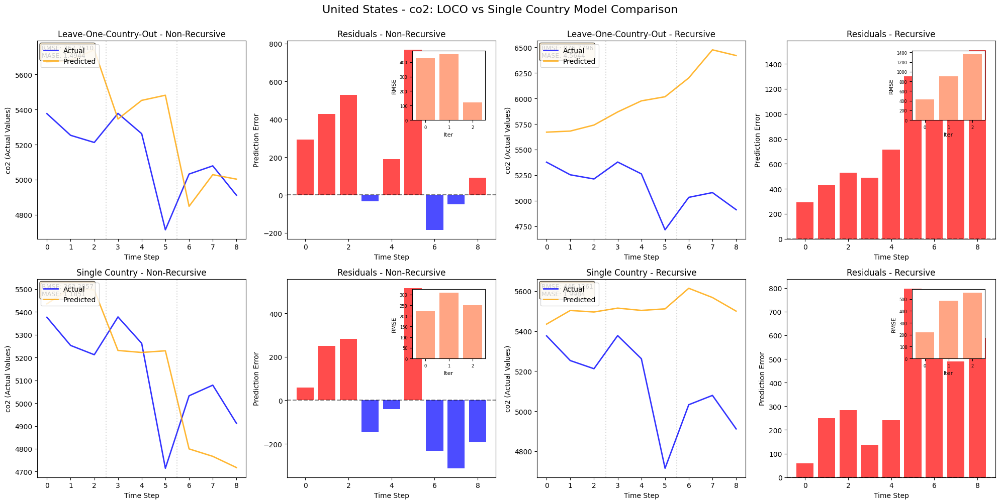

Plot saved for United States

Plot comparison for China


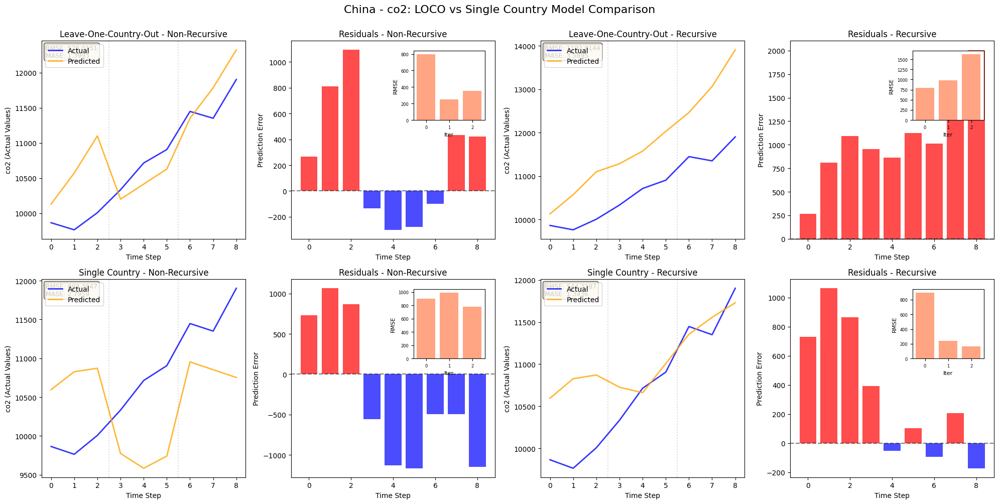

Plot saved for China

Plot comparison for Japan


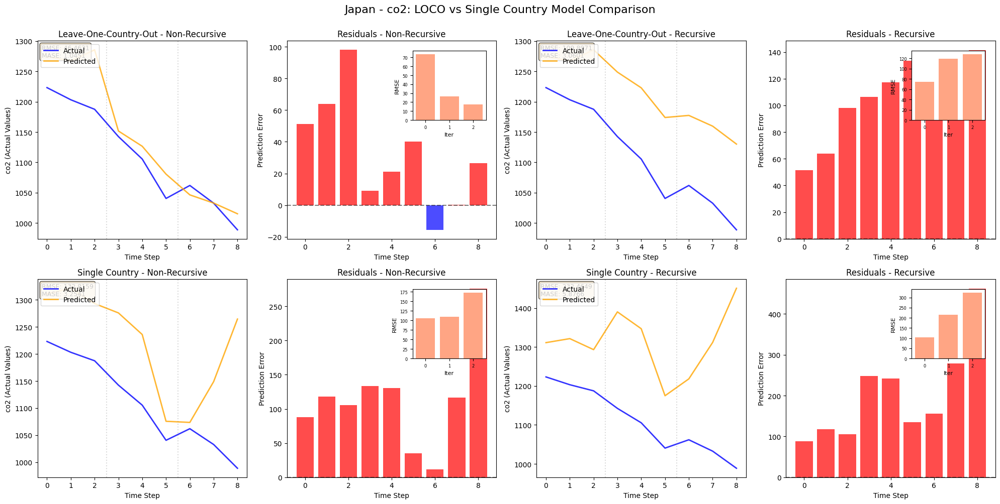

Plot saved for Japan

Plot comparison for Germany


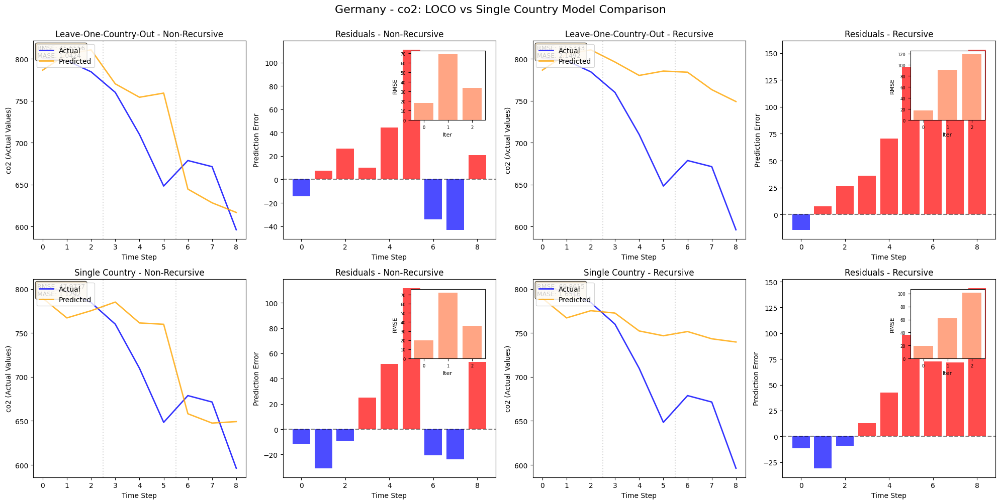

Plot saved for Germany

Plot comparison for United Kingdom


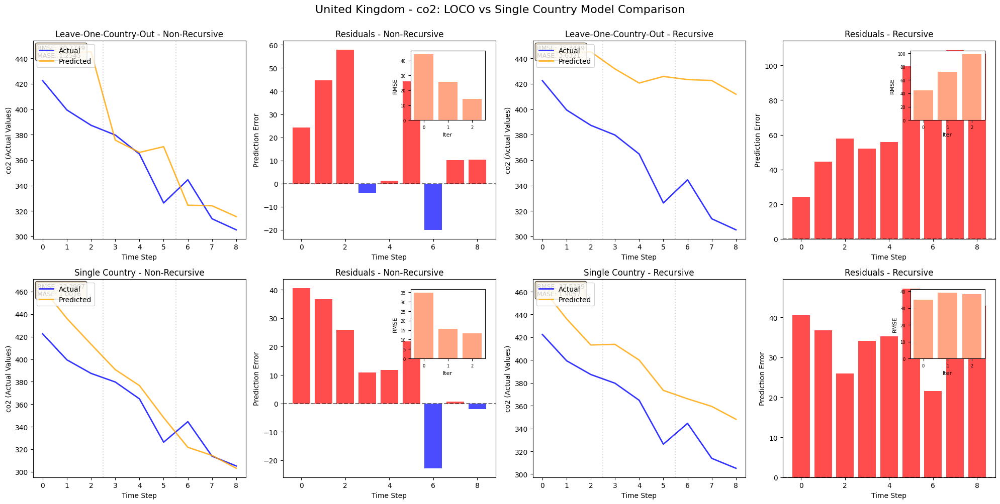

Plot saved for United Kingdom

Plot comparison for France


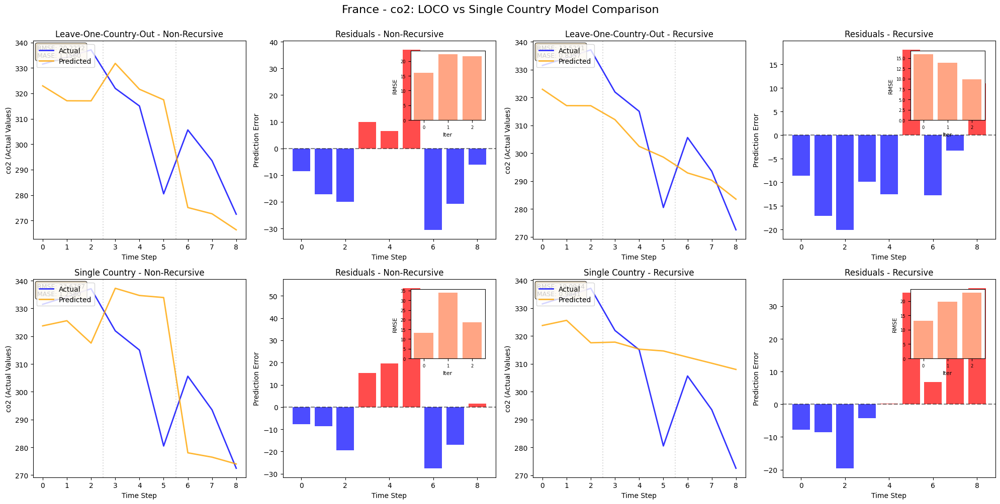

Plot saved for France

Plot comparison for Italy


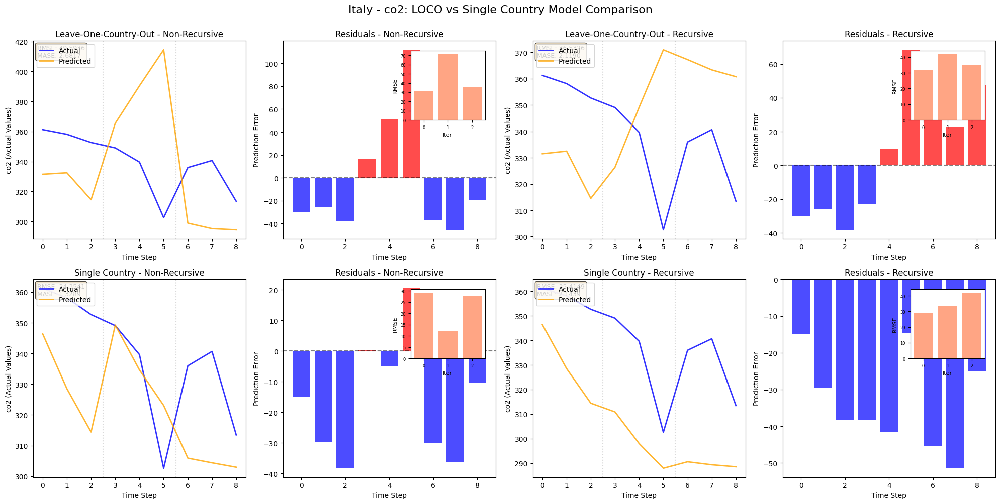

Plot saved for Italy

Plot comparison for Canada


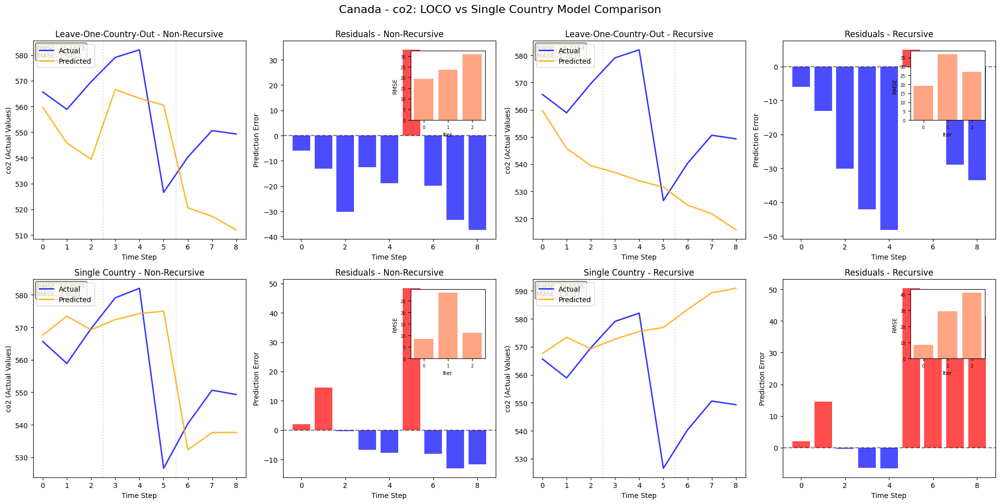

Plot saved for Canada

Plot comparison for Brazil


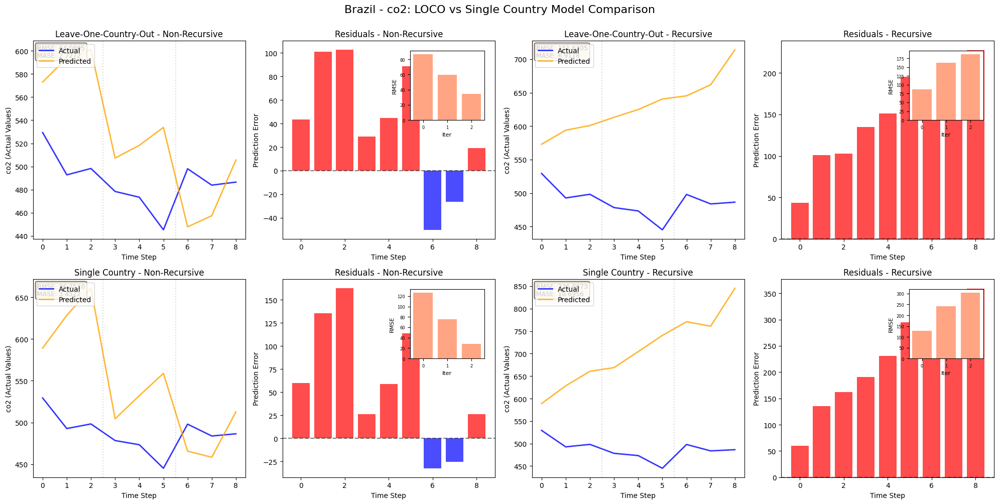

Plot saved for Brazil

Plot comparison for Russia


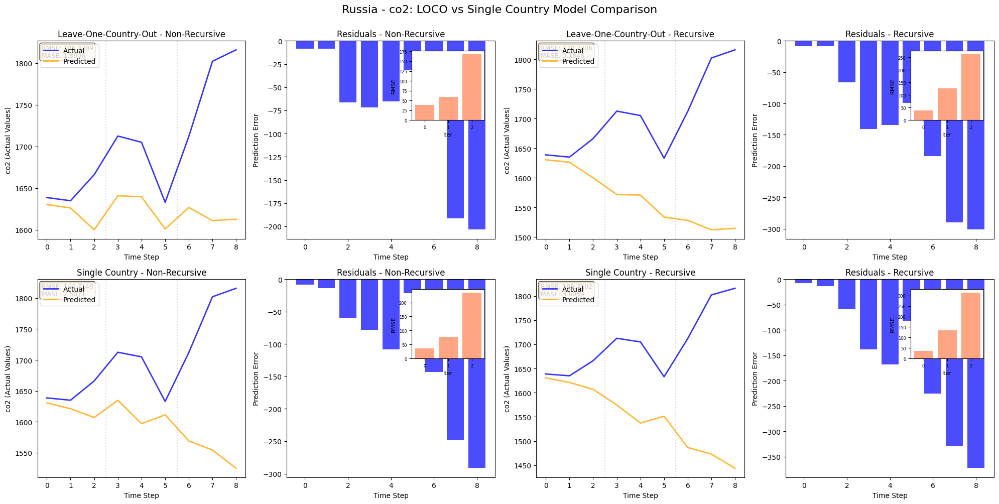

Plot saved for Russia

Plot comparison for India


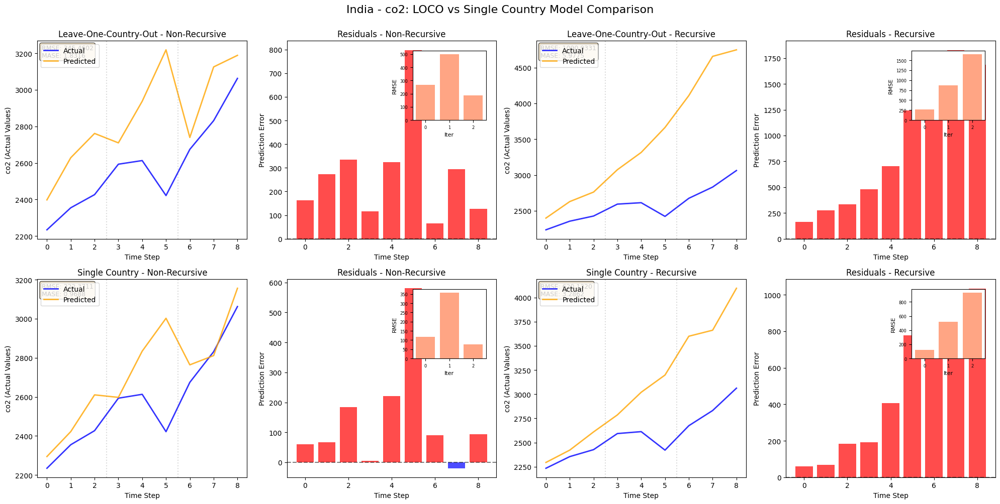

Plot saved for India

Plot comparison for Australia


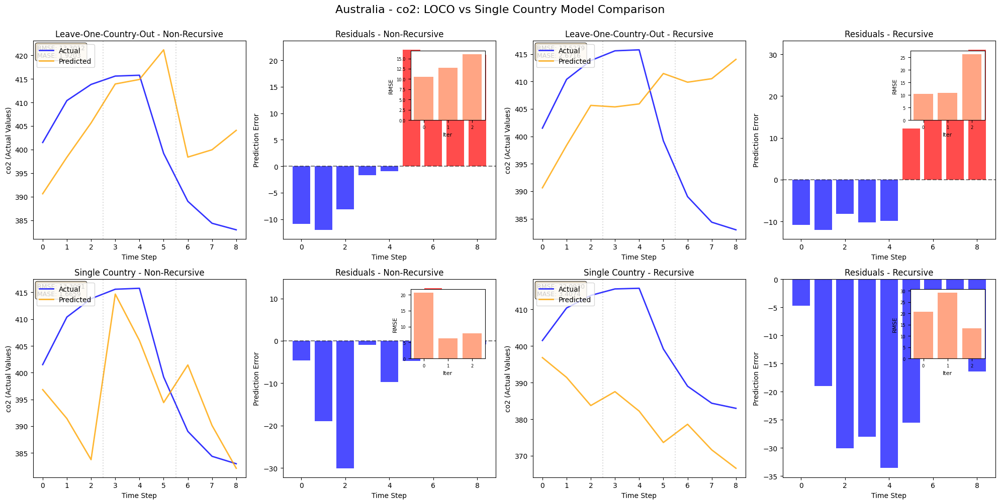

Plot saved for Australia

Plot comparison for Mexico


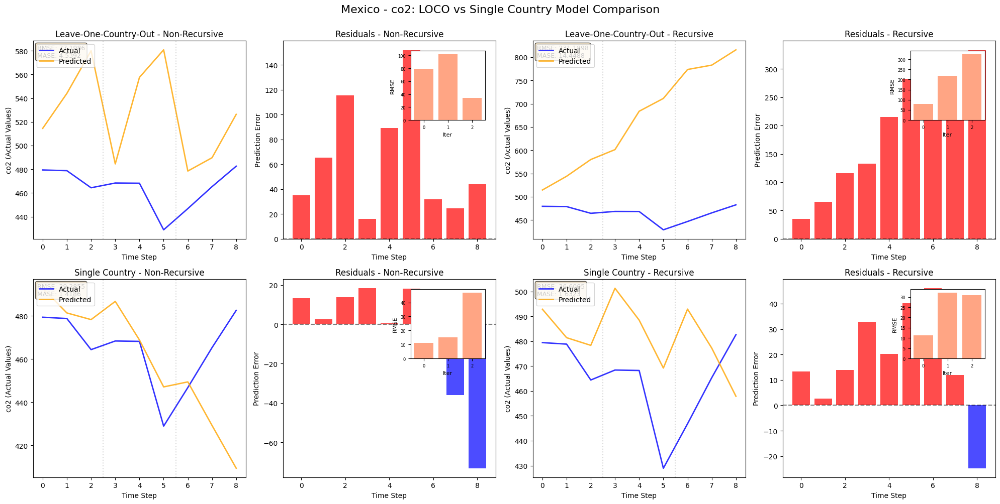

Plot saved for Mexico

Plot comparison for Indonesia


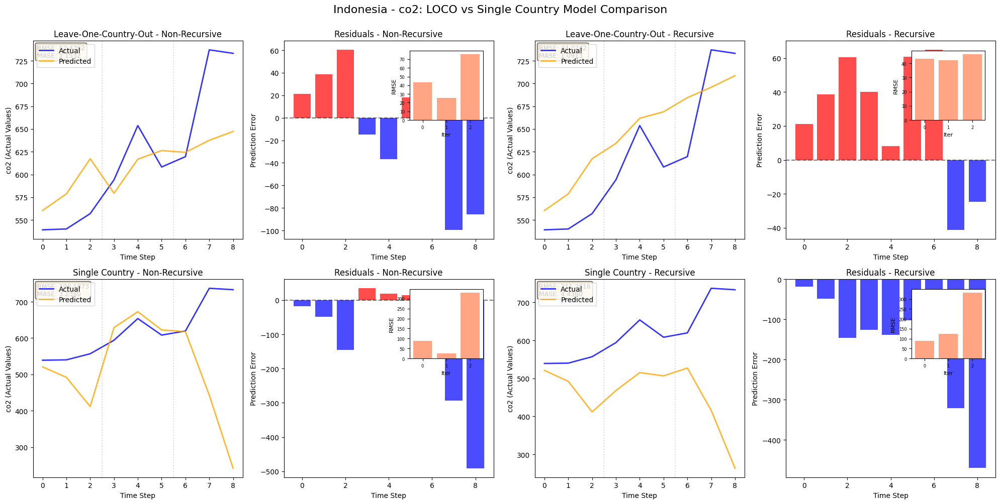

Plot saved for Indonesia

Plot comparison for Turkey


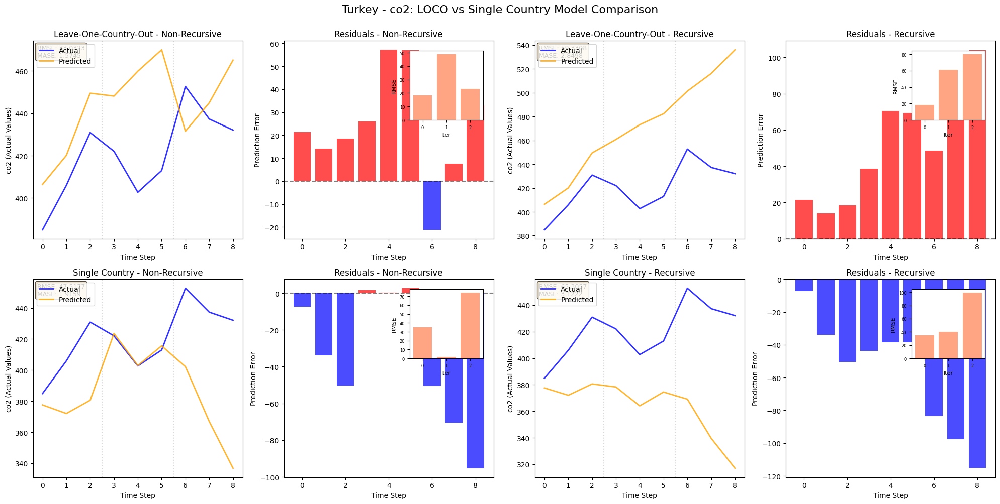

Plot saved for Turkey

Plot comparison for Saudi Arabia


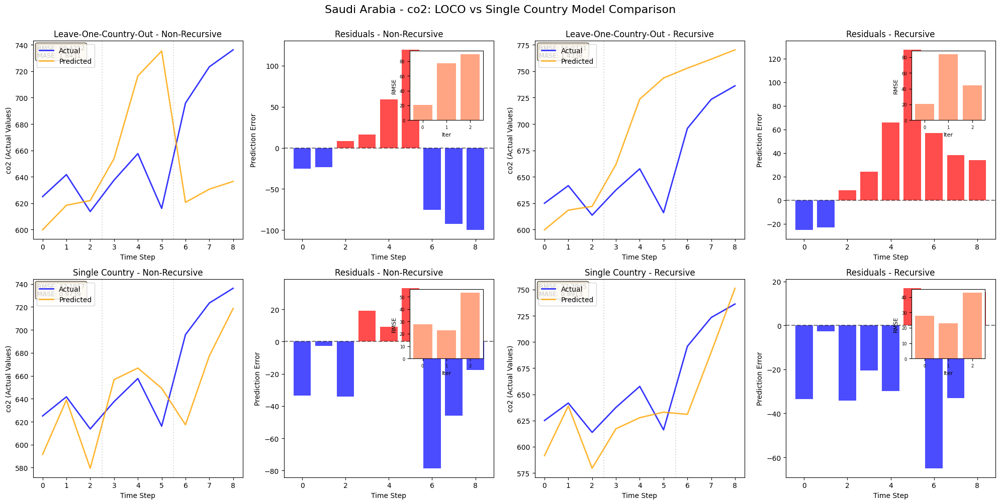

Plot saved for Saudi Arabia

Plot comparison for South Africa


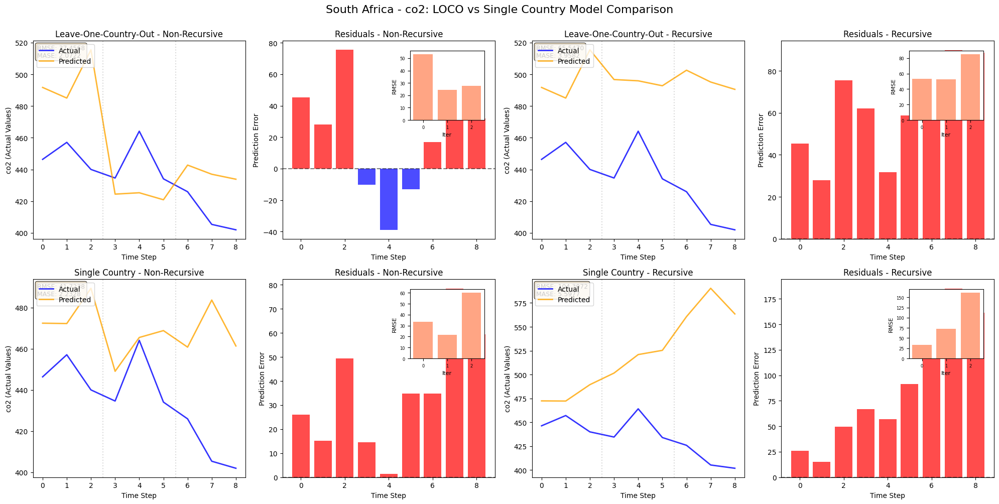

Plot saved for South Africa

Plot comparison for Argentina


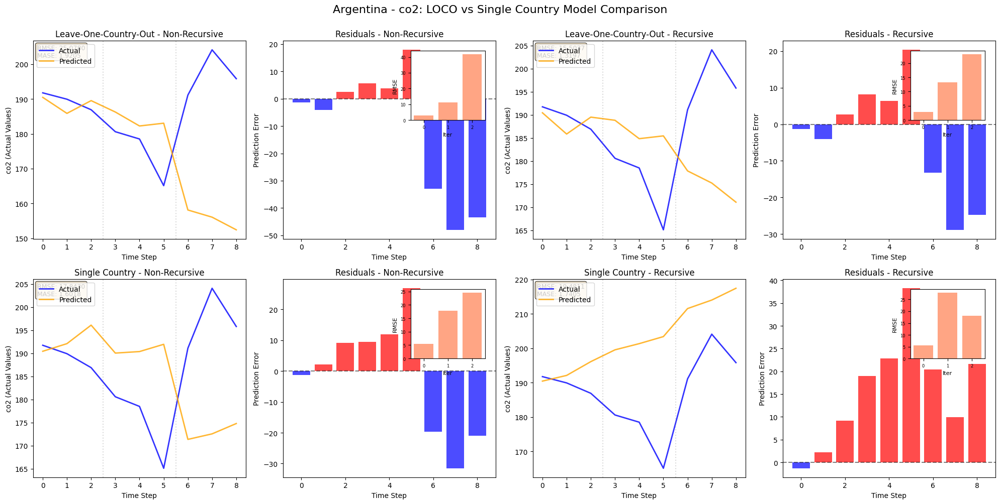

Plot saved for Argentina

Plot comparison for South Korea


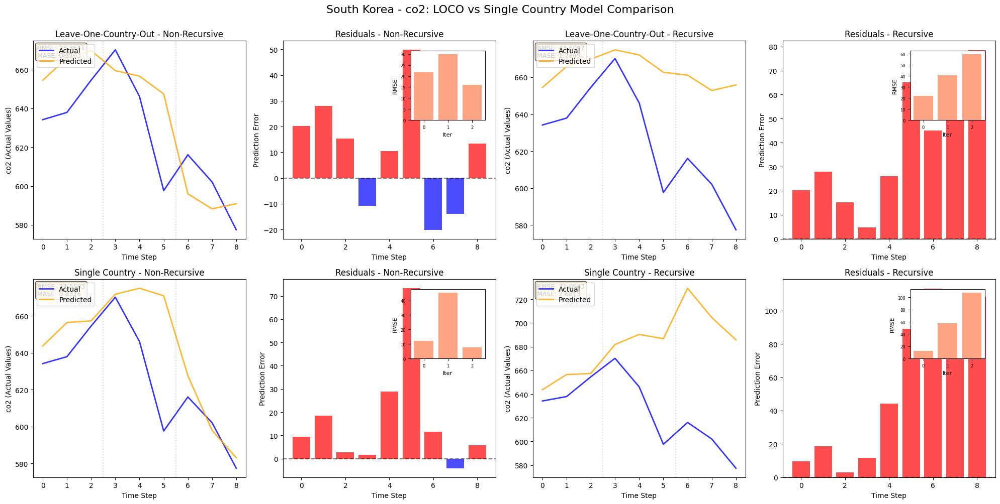

Plot saved for South Korea


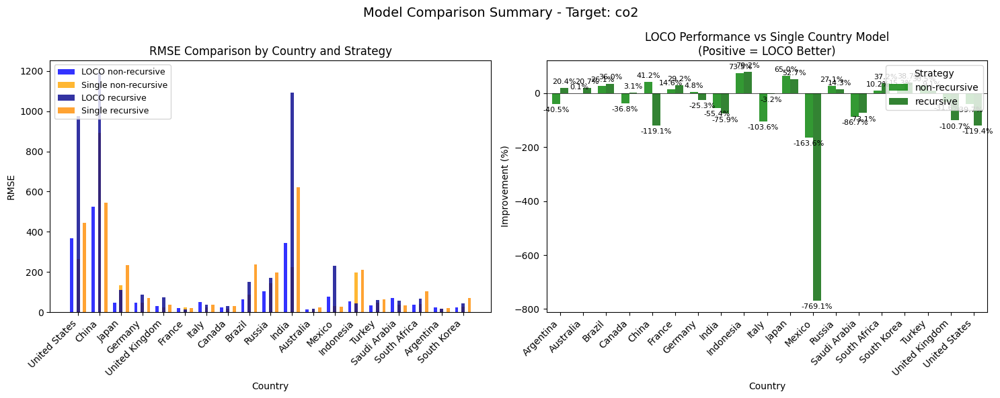

Summary plot saved
NUMERICAL SUMMARY

United States:
  non_recursive:
    LOCO RMSE:    367.7510
    Single RMSE: 263.2857
    Improvement: -39.68%
  recursive:
    LOCO RMSE:    976.7796
    Single RMSE: 445.1261
    Improvement: -119.44%

China:
  non_recursive:
    LOCO RMSE:    525.0151
    Single RMSE: 893.3947
    Improvement: 41.23%
  recursive:
    LOCO RMSE:    1192.8144
    Single RMSE: 544.3387
    Improvement: -119.13%

Germany:
  non_recursive:
    LOCO RMSE:    45.6556
    Single RMSE: 47.9727
    Improvement: 4.83%
  recursive:
    LOCO RMSE:    87.5333
    Single RMSE: 69.8615
    Improvement: -25.30%


({'United States': {'loco': {'non_recursive': {'predictions_pct': array([ 0.02561205,  0.00185324,  0.01039236,  0.02563314,  0.01984767,
             0.00537723,  0.0283882 ,  0.03716217, -0.00504742], dtype=float32),
     'actuals_pct': array([-0.02753062, -0.02297808, -0.00776138,  0.03177856, -0.02150546,
            -0.10404825,  0.06736162,  0.00927187, -0.03297583]),
     'iterations': array([0, 0, 0, 1, 1, 1, 2, 2, 2]),
     'metrics':    iteration        rmse      mase
     0          0  427.323280  5.068968
     1          1  456.298789  0.993520
     2          2  122.100468  1.014433,
     'predictions_actual': array([5670.28155925, 5680.78988163, 5739.8264011 , 5345.76585254,
            5451.86664302, 5481.18227544, 4848.46809393, 5028.64776082,
            5003.26596031]),
     'actuals_actual': array([5376.473, 5252.932, 5212.162, 5377.797, 5262.145, 4714.628,
            5032.213, 5078.871, 4911.391])},
    'recursive': {'predictions_pct': array([ 0.02561205,  0.001853

In [75]:
co2_combined_run()


LOCO vs SINGLE COUNTRY MODELS
Target: gdp
Model: build_cnn
Test size: 9 samples
Data Shape: (1138, 992)
TESTING COUNTRY: United States

LEAVE-ONE-COUNTRY-OUT MODEL
Leave-One-Country-Out Comparison for: United States
Total training samples from other countries: 611
Test country train samples: 25
Test country test samples: 9
Training sequences: 604
    Iter 0: Using last 5 train values
    RMSE: 653211026022.3748, MASE: 1.6803
    Iter 1: Using last 2 train + test[0:3]
    RMSE: 840714727310.9182, MASE: 1.6685
    Iter 2: Using test[1:6]
    RMSE: 639552571353.7672, MASE: 0.8457
    Iter 0: Using last 5 training values
    RMSE: 653211026022.3748, MASE: 1.6803
    Iter 1: Using last 2 training + pred[0:3]
    RMSE: 1686339860308.7788, MASE: 3.4600
    Iter 2: Using pred[1:6]
    RMSE: 2836793964028.0039, MASE: 3.7089

Summary for United States

Non-Recursive (actual values):
  Overall RMSE: 717057270785.6954
  Overall MASE: 1.3317
  Predictions made: 9

Recursive (actual values):
  Over

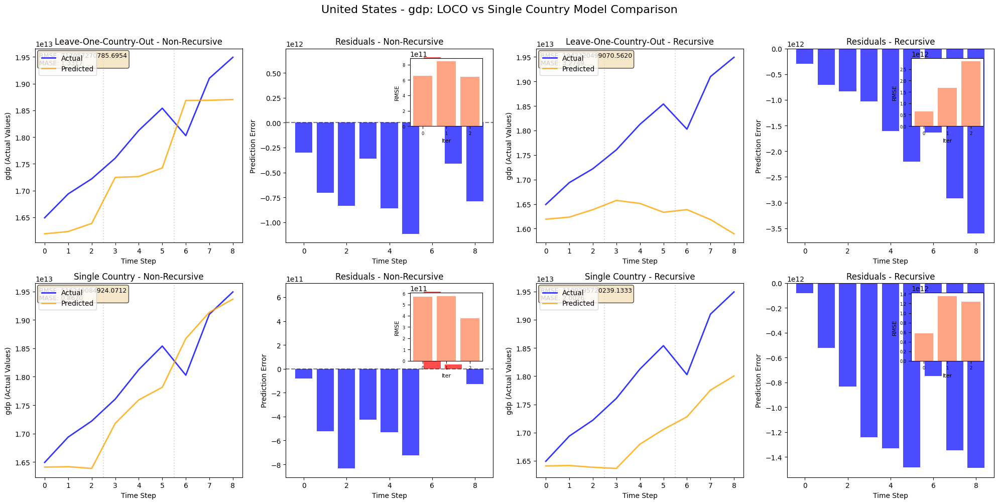

Plot saved for United States

Plot comparison for China


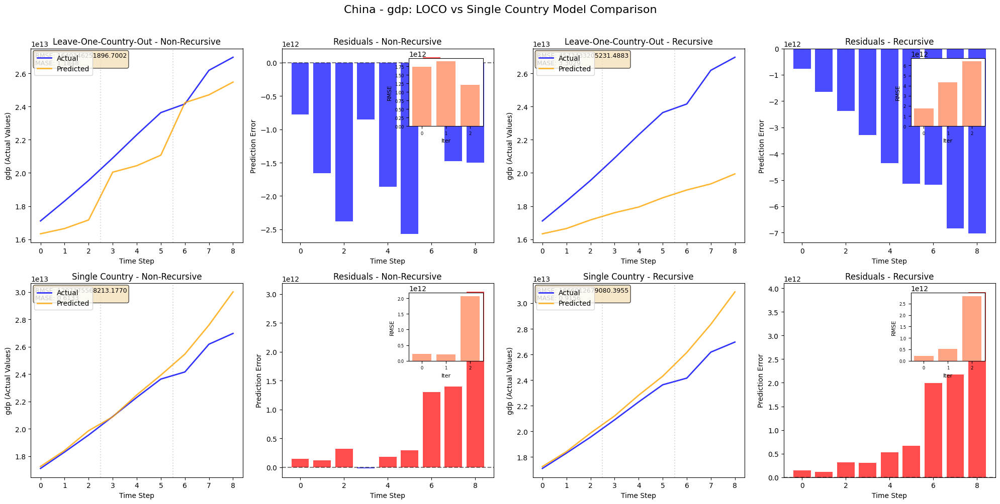

Plot saved for China

Plot comparison for Japan


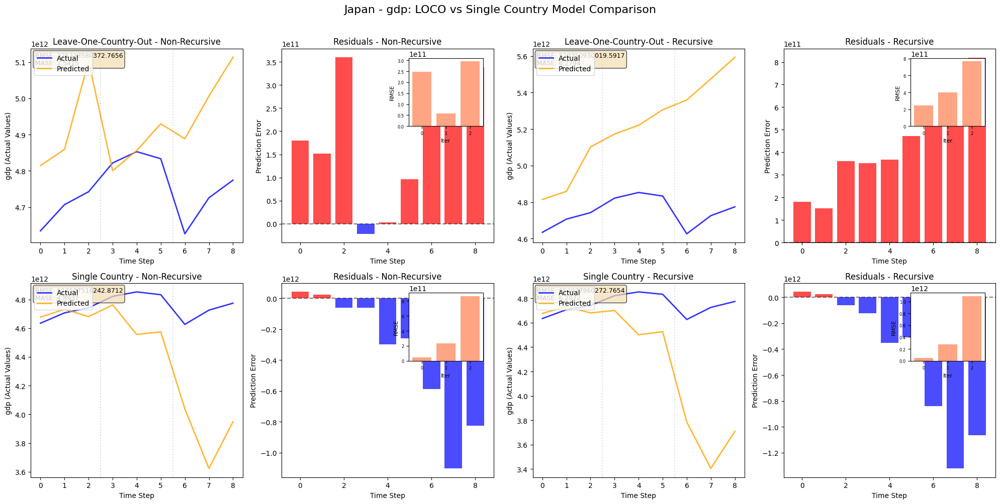

Plot saved for Japan

Plot comparison for Germany


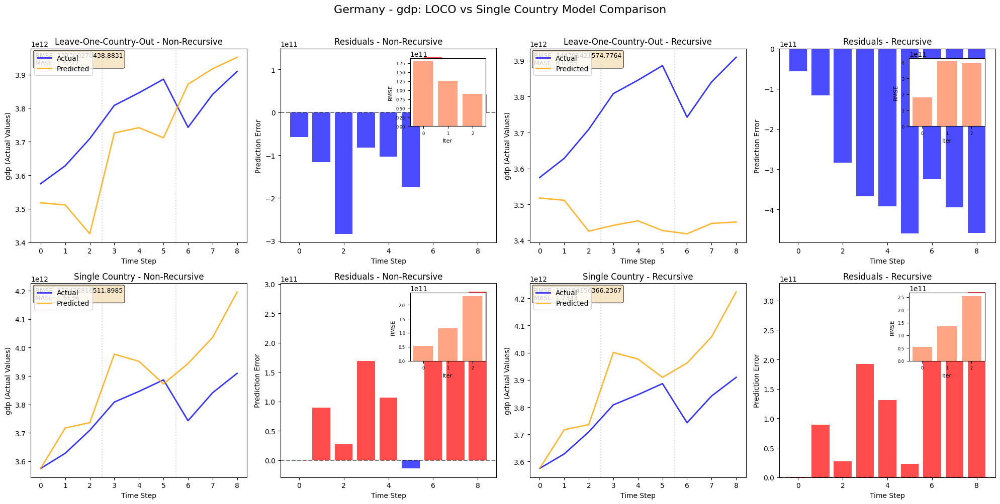

Plot saved for Germany

Plot comparison for United Kingdom


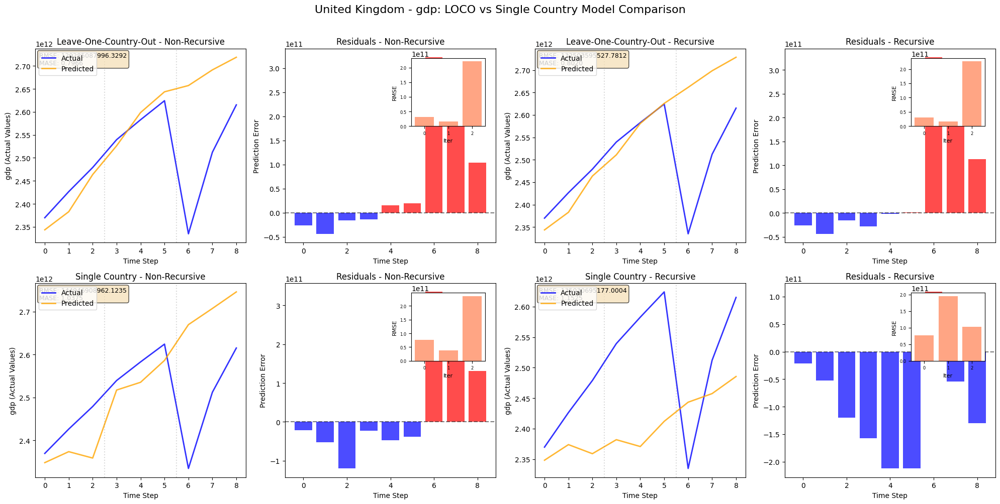

Plot saved for United Kingdom

Plot comparison for France


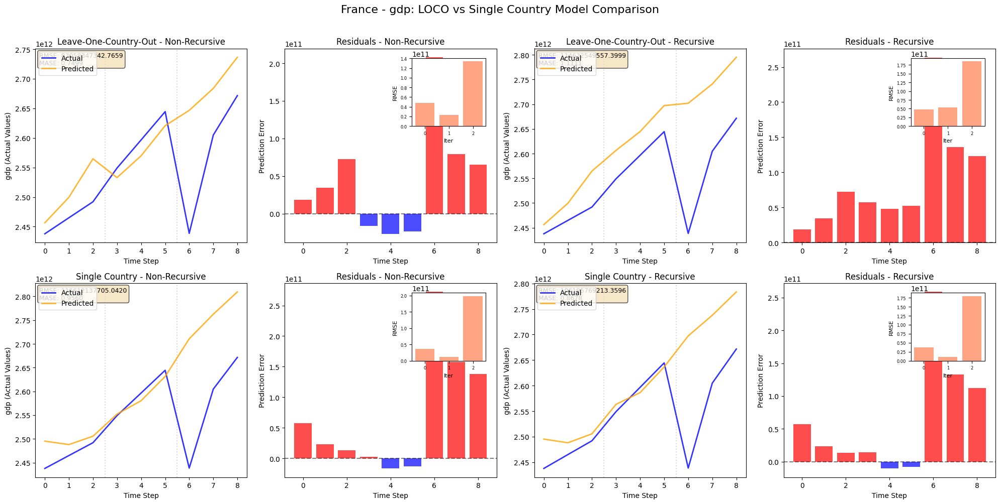

Plot saved for France

Plot comparison for Italy


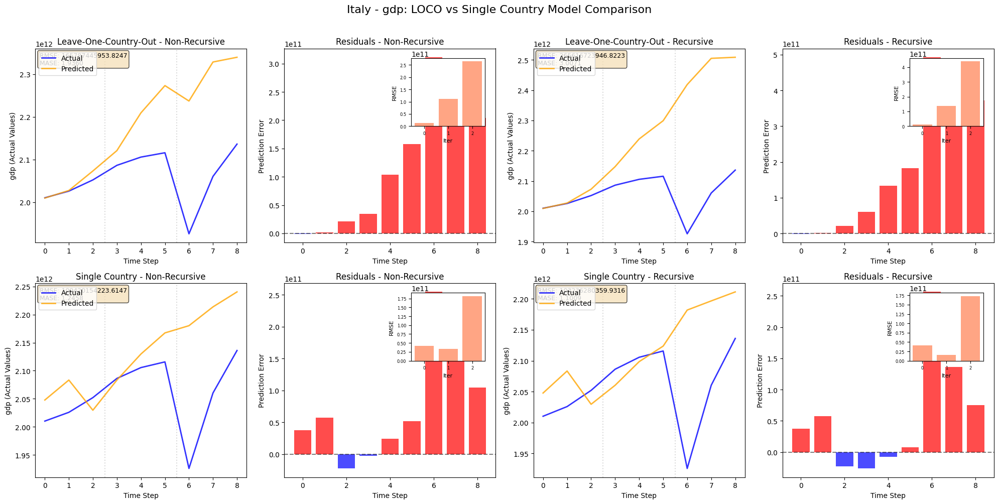

Plot saved for Italy

Plot comparison for Canada


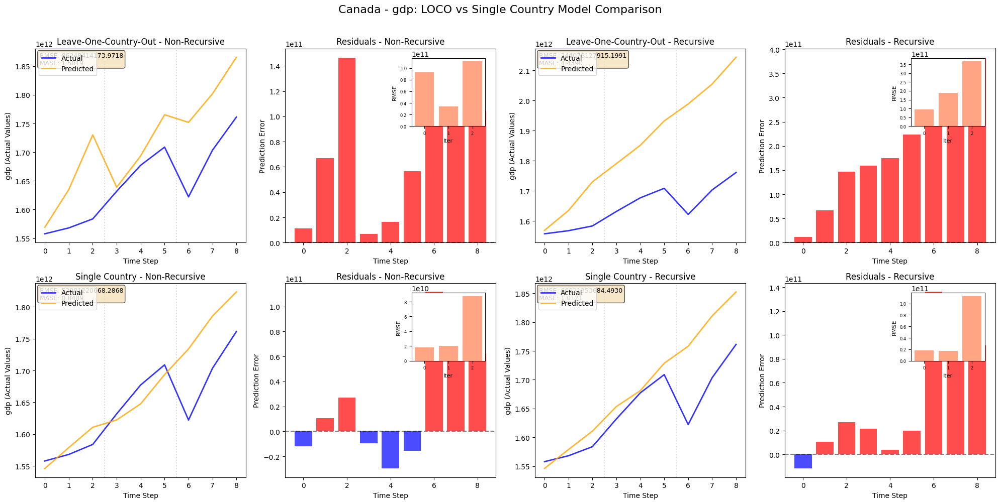

Plot saved for Canada

Plot comparison for Brazil


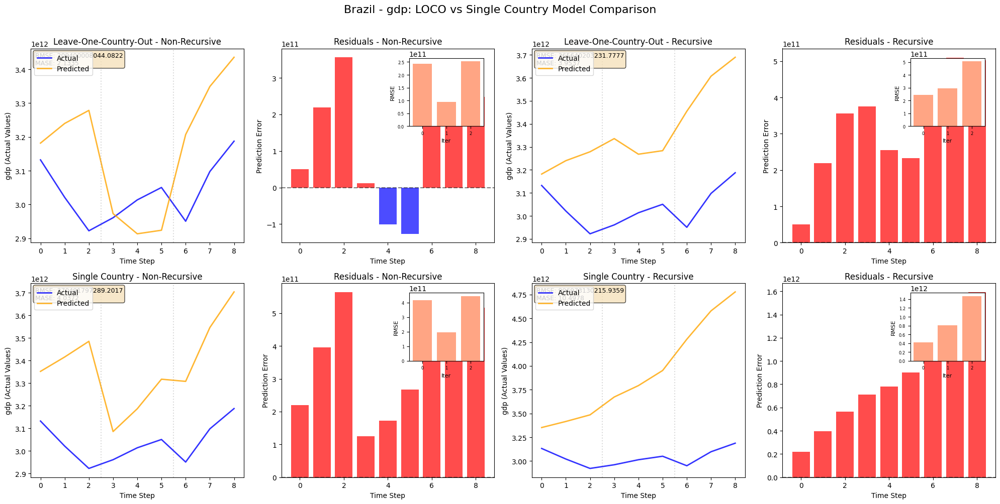

Plot saved for Brazil

Plot comparison for Russia


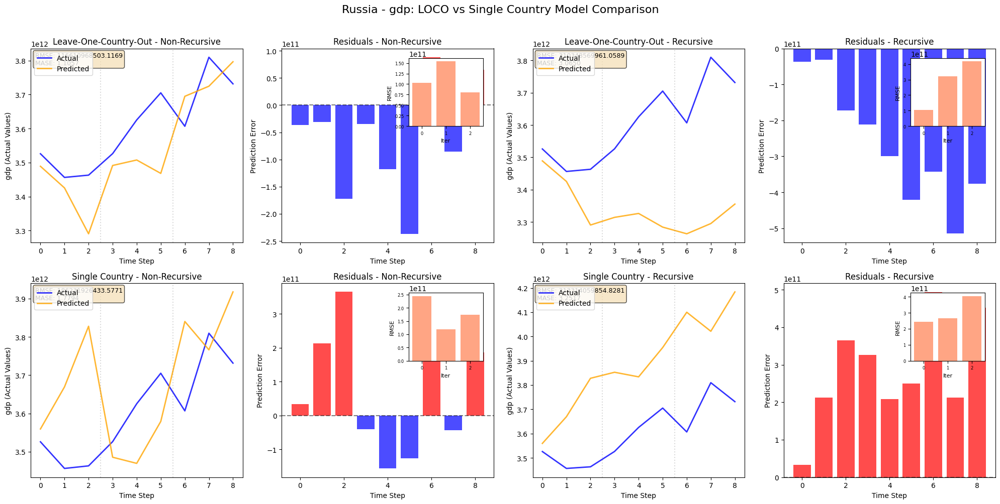

Plot saved for Russia

Plot comparison for India


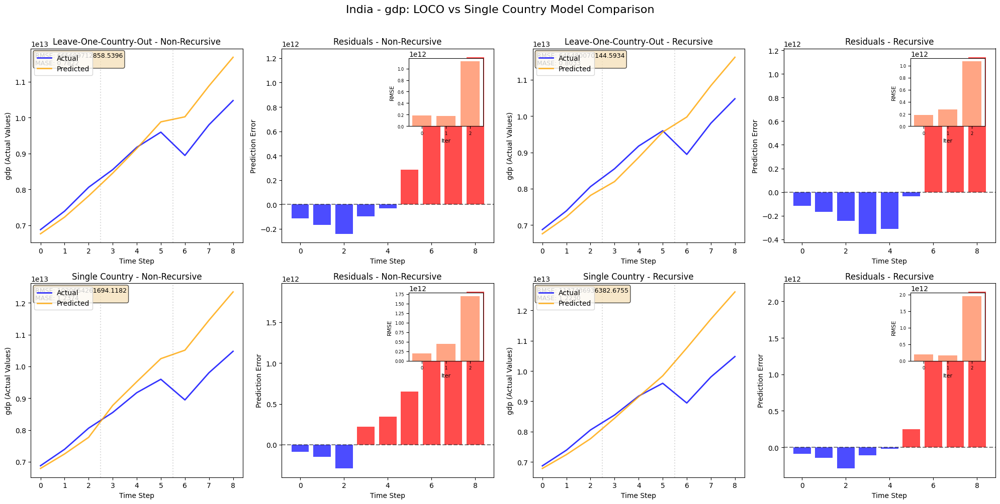

Plot saved for India

Plot comparison for Australia


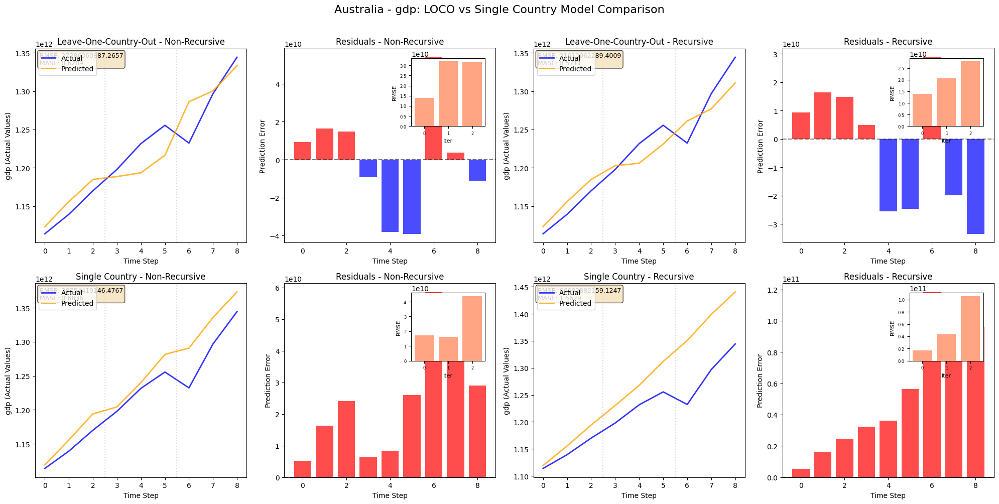

Plot saved for Australia

Plot comparison for Mexico


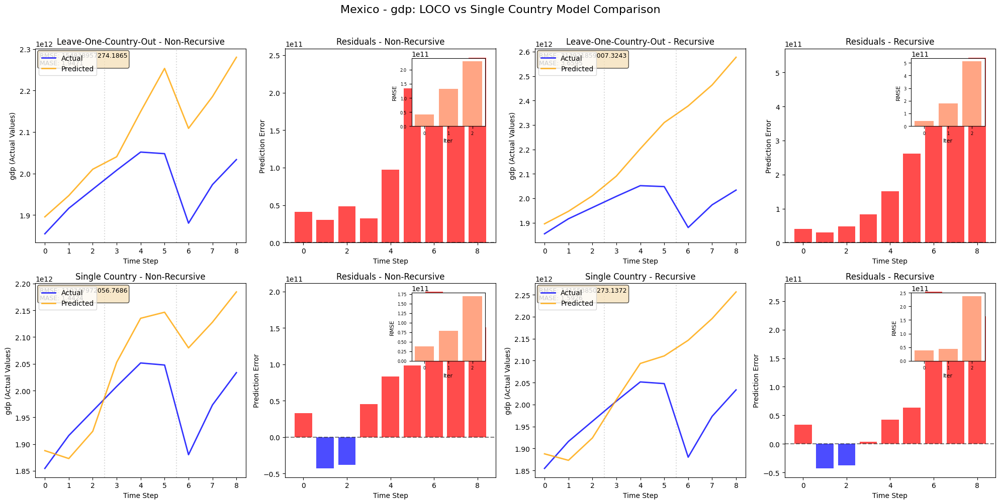

Plot saved for Mexico

Plot comparison for Indonesia


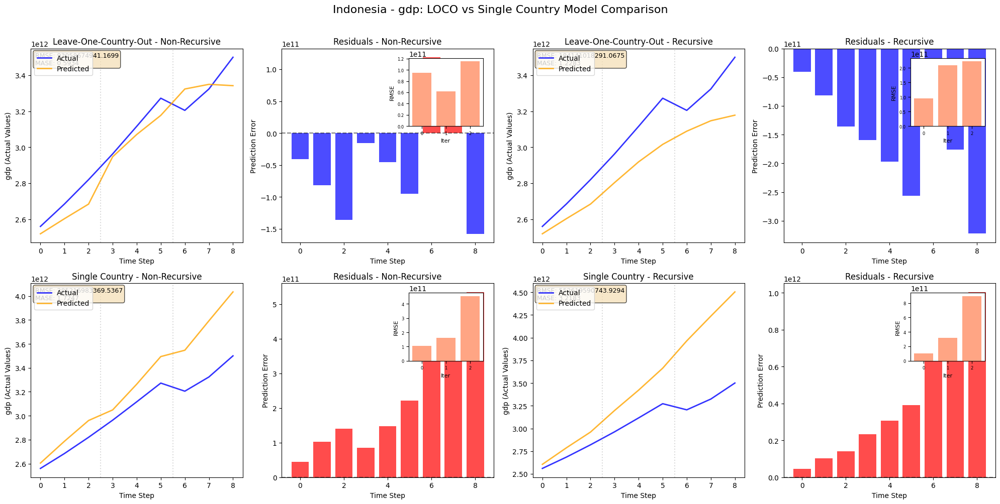

Plot saved for Indonesia

Plot comparison for Turkey


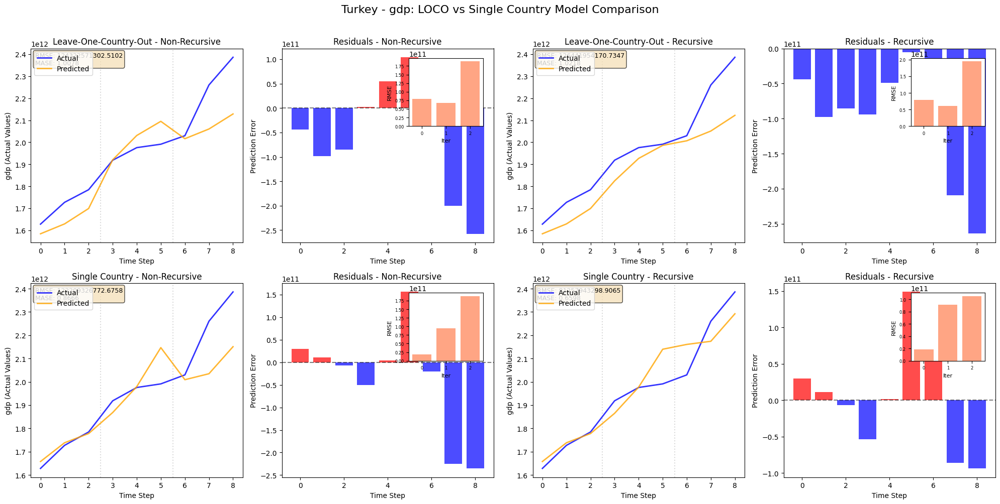

Plot saved for Turkey

Plot comparison for Saudi Arabia


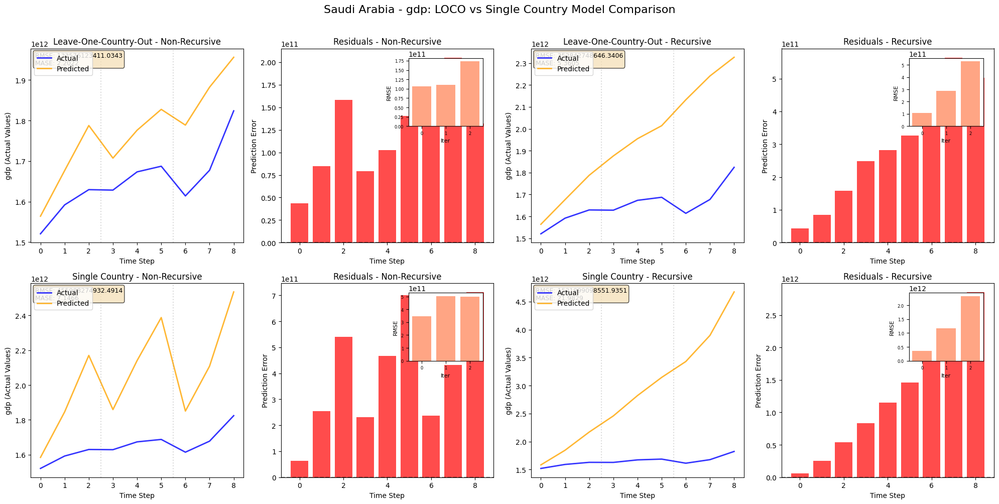

Plot saved for Saudi Arabia

Plot comparison for South Africa


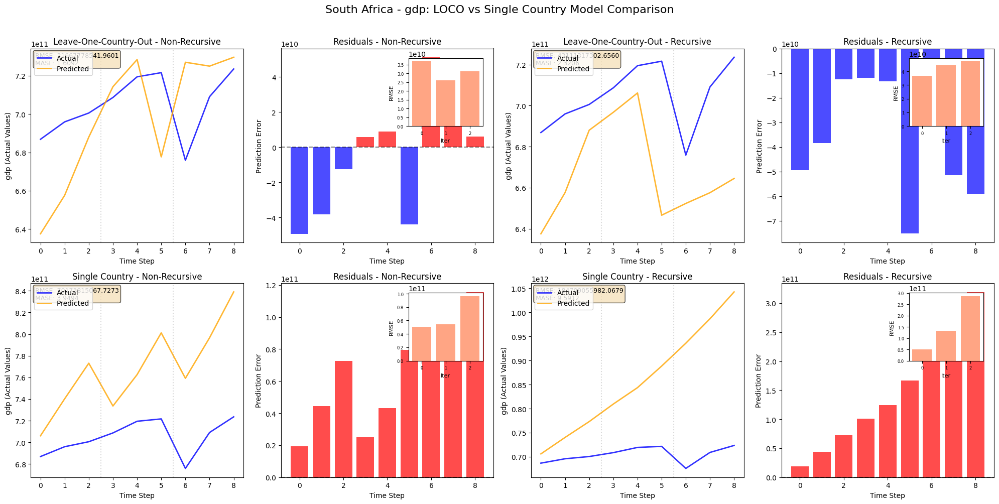

Plot saved for South Africa

Plot comparison for Argentina


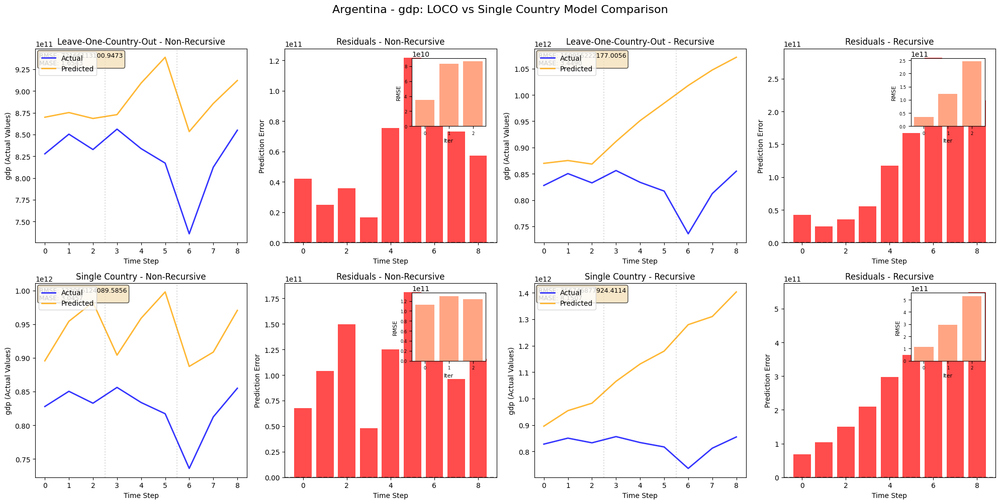

Plot saved for Argentina

Plot comparison for South Korea


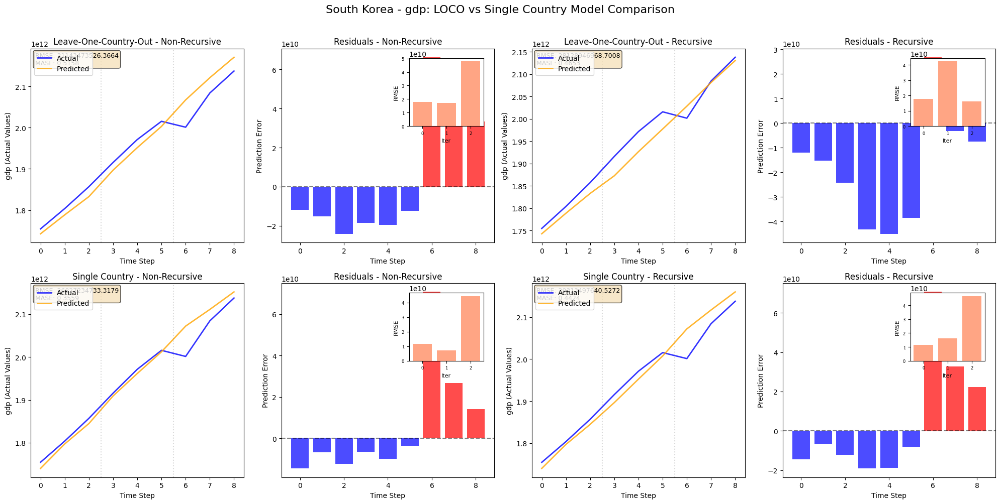

Plot saved for South Korea


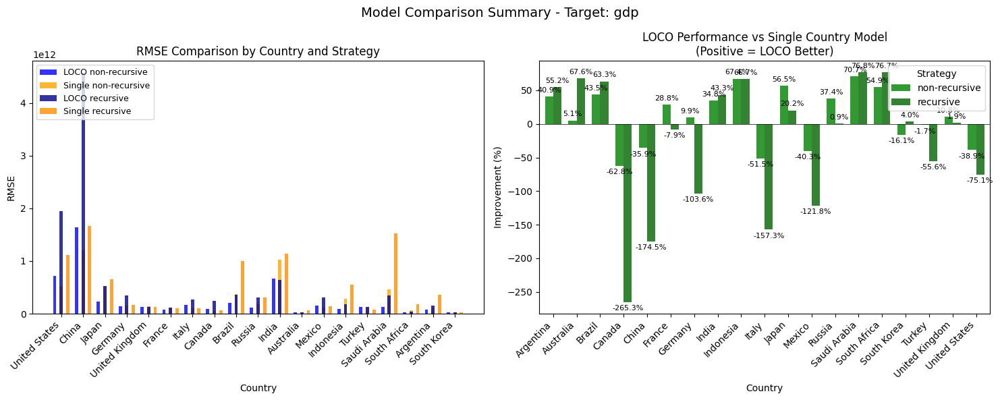

Summary plot saved
NUMERICAL SUMMARY

United States:
  non_recursive:
    LOCO RMSE:    717057270785.6954
    Single RMSE: 516249084924.0712
    Improvement: -38.90%
  recursive:
    LOCO RMSE:    1942320499070.5620
    Single RMSE: 1109295720239.1333
    Improvement: -75.09%

China:
  non_recursive:
    LOCO RMSE:    1640346251896.7002
    Single RMSE: 1207375568213.1770
    Improvement: -35.86%
  recursive:
    LOCO RMSE:    4573433205231.4883
    Single RMSE: 1666012679080.3955
    Improvement: -174.51%

Germany:
  non_recursive:
    LOCO RMSE:    137300270438.8831
    Single RMSE: 152422816511.8985
    Improvement: 9.92%
  recursive:
    LOCO RMSE:    344391421574.7764
    Single RMSE: 169184156366.2367
    Improvement: -103.56%


({'United States': {'loco': {'non_recursive': {'predictions_pct': array([0.00431971, 0.00258518, 0.00937444, 0.00155219, 0.00089068,
            0.00935924, 0.00781566, 0.00018161, 0.00072026], dtype=float32),
     'actuals_pct': array([ 0.02287776,  0.02706369,  0.01667475,  0.0224191 ,  0.0294539 ,
             0.02294433, -0.02767943,  0.05946617,  0.02061809]),
     'iterations': array([0, 0, 0, 1, 1, 1, 2, 2, 2]),
     'metrics':    iteration          rmse      mase
     0          0  6.532110e+11  1.680296
     1          1  8.407147e+11  1.668542
     2          2  6.395526e+11  0.845713,
     'predictions_actual': array([1.61921163e+13, 1.62339757e+13, 1.63861611e+13, 1.72467947e+13,
            1.72621570e+13, 1.74237176e+13, 1.86854595e+13, 1.86888519e+13,
            1.87023128e+13]),
     'actuals_actual': array([1.64913186e+13, 1.69376345e+13, 1.72200653e+13, 1.76061237e+13,
            1.81246928e+13, 1.85405517e+13, 1.80273598e+13, 1.90993777e+13,
            1.94931704e

In [76]:
gdp_combined_run()


LOCO vs SINGLE COUNTRY MODELS
Target: primary_energy_consumption
Model: build_bilstm
Test size: 9 samples
Data Shape: (1138, 992)
TESTING COUNTRY: United States

LEAVE-ONE-COUNTRY-OUT MODEL
Leave-One-Country-Out Comparison for: United States
Total training samples from other countries: 629
Test country train samples: 26
Test country test samples: 9
Training sequences: 622
    Iter 0: Using last 5 train values
    RMSE: 770.5047, MASE: 12.6884
    Iter 1: Using last 2 train + test[0:3]
    RMSE: 2156.3171, MASE: 1.7387
    Iter 2: Using test[1:6]
    RMSE: 2668.1132, MASE: 6.1449
    Iter 0: Using last 5 training values
    RMSE: 770.5047, MASE: 12.6884
    Iter 1: Using last 2 training + pred[0:3]
    RMSE: 3352.7450, MASE: 2.9774
    Iter 2: Using pred[1:6]
    RMSE: 5749.6069, MASE: 13.3090

Summary for United States

Non-Recursive (actual values):
  Overall RMSE: 2029.9597
  Overall MASE: 2.5947
  Predictions made: 9

Recursive (actual values):
  Overall RMSE: 3868.3569
  Overall M

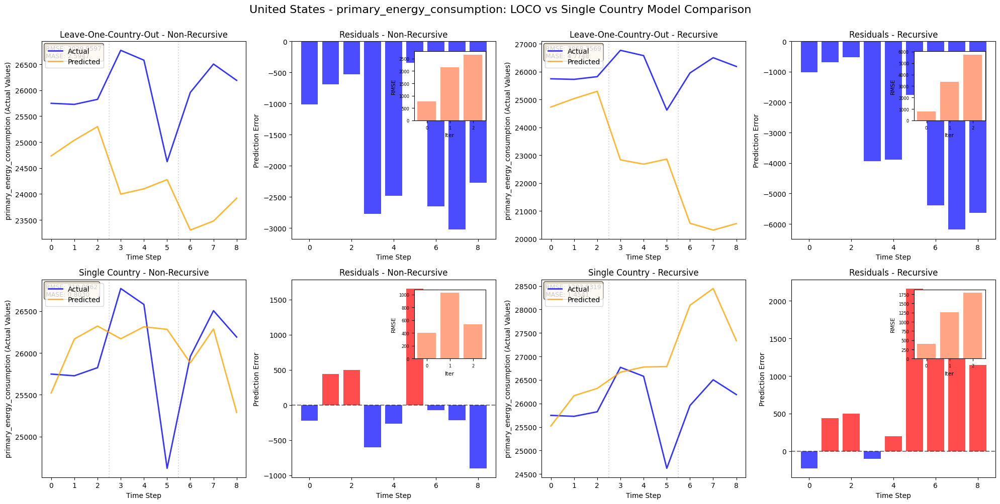

Plot saved for United States

Plot comparison for China


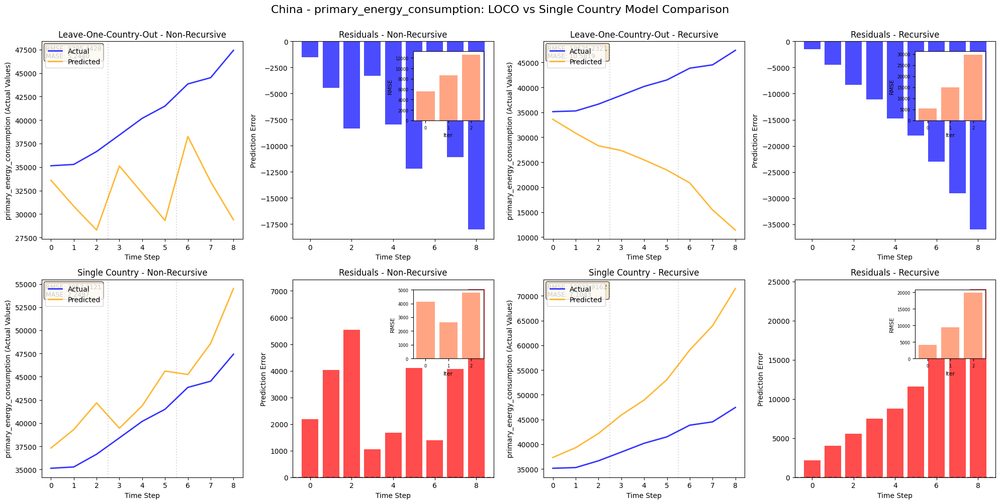

Plot saved for China

Plot comparison for Japan


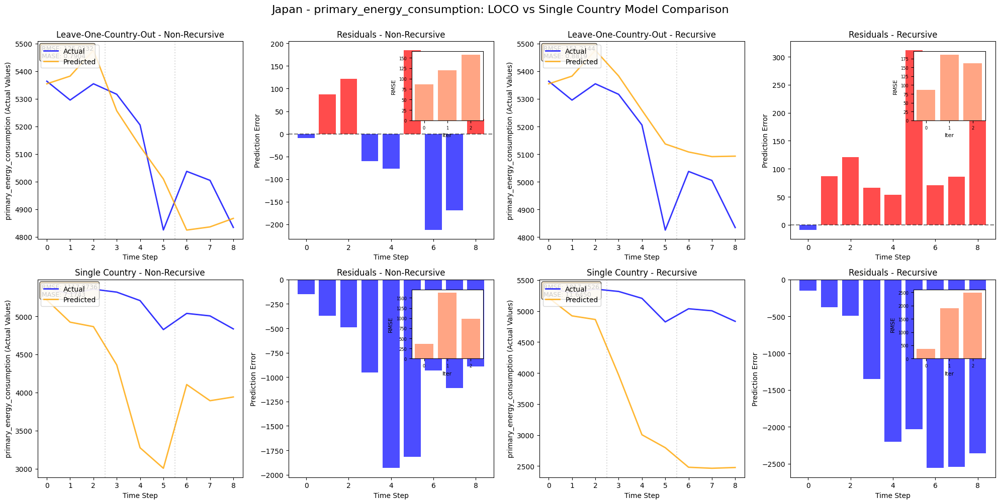

Plot saved for Japan

Plot comparison for Germany


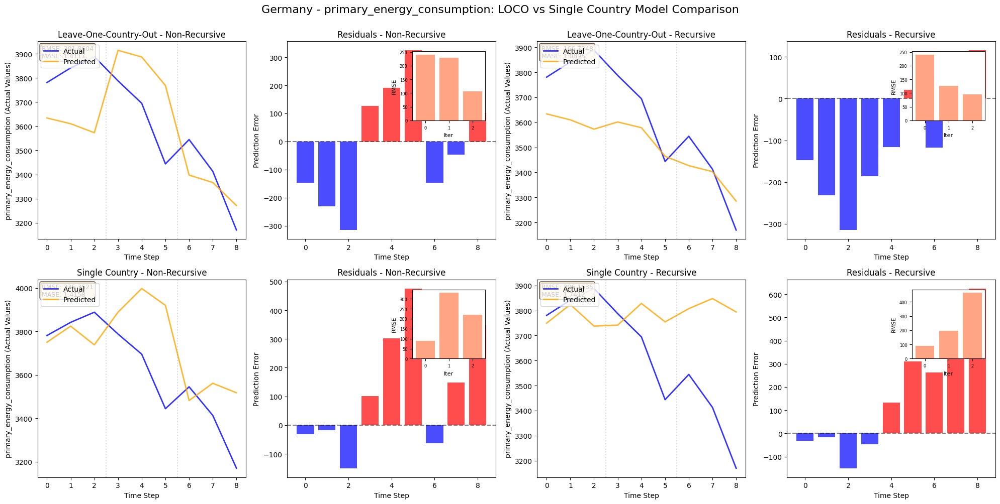

Plot saved for Germany

Plot comparison for United Kingdom


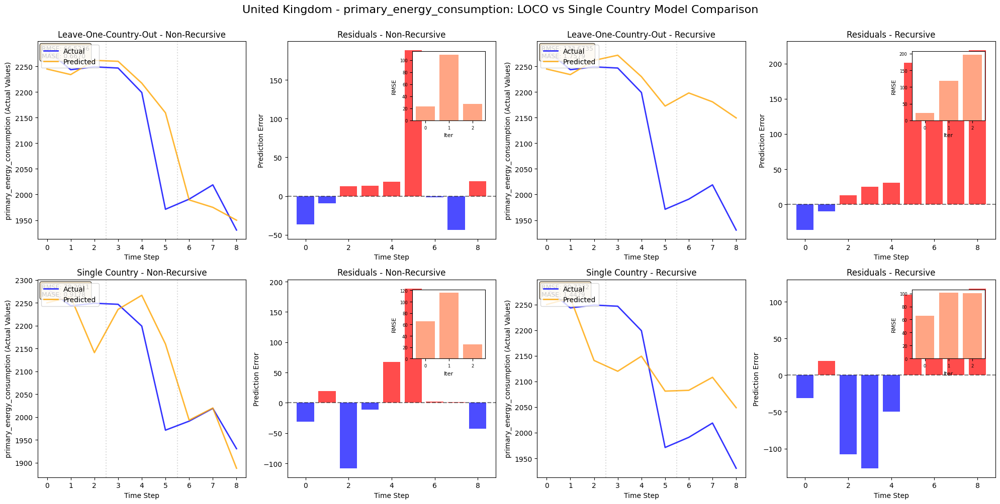

Plot saved for United Kingdom

Plot comparison for France


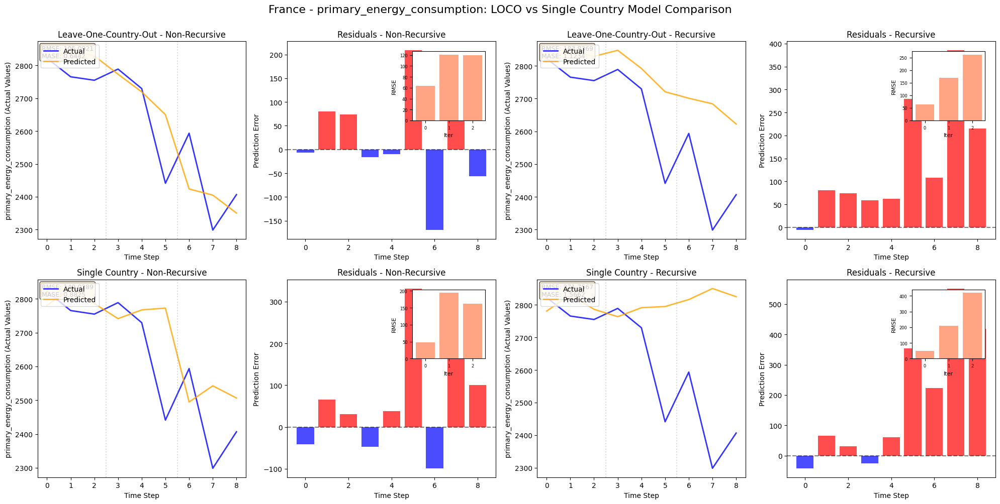

Plot saved for France

Plot comparison for Italy


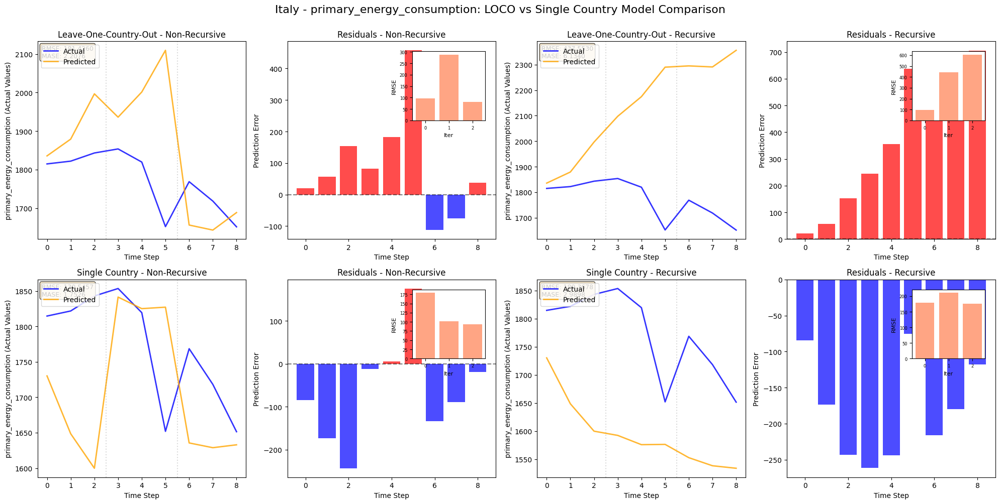

Plot saved for Italy

Plot comparison for Canada


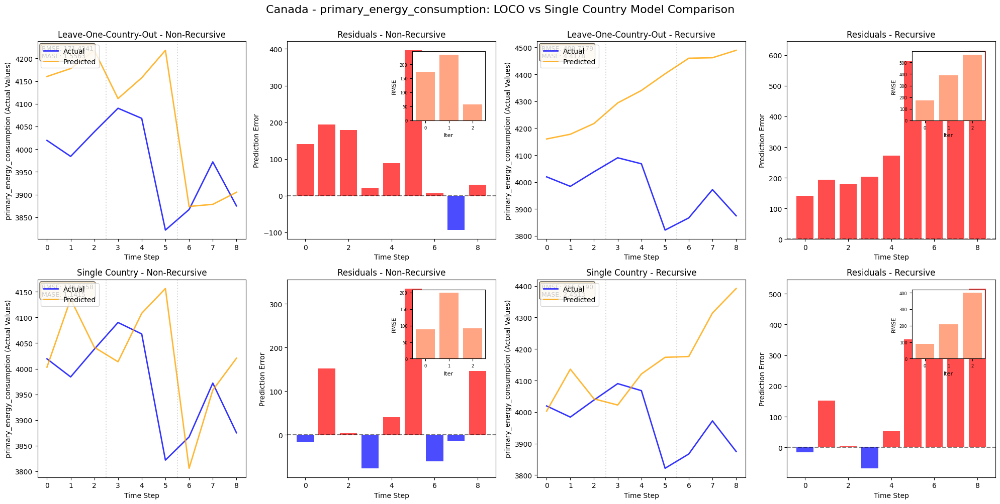

Plot saved for Canada

Plot comparison for Brazil


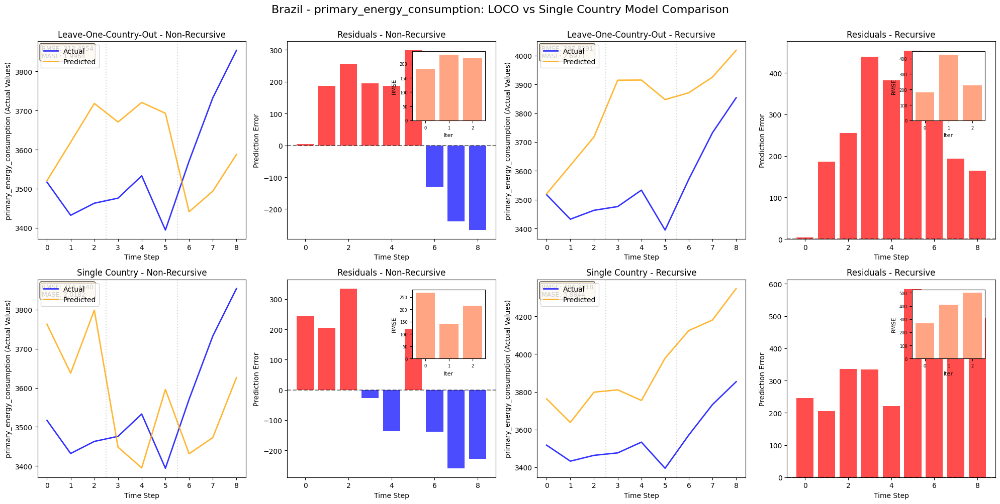

Plot saved for Brazil

Plot comparison for Russia


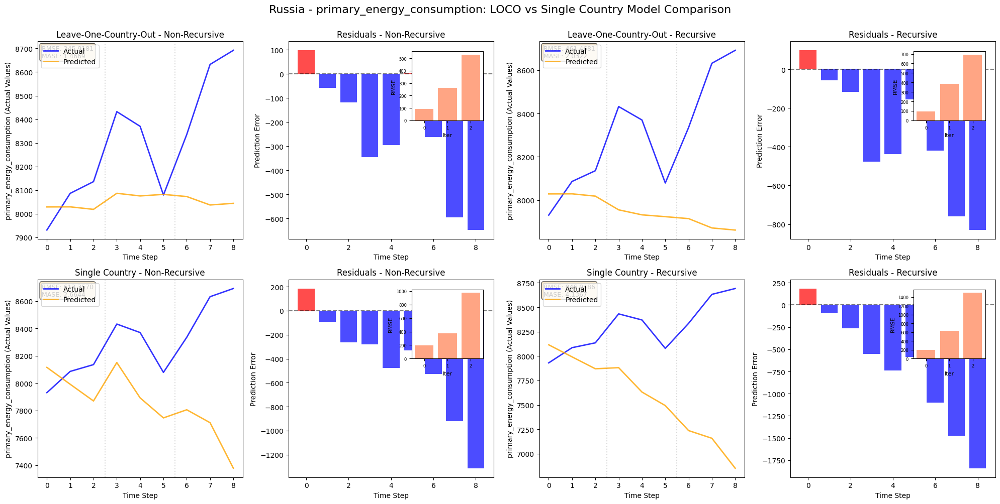

Plot saved for Russia

Plot comparison for India


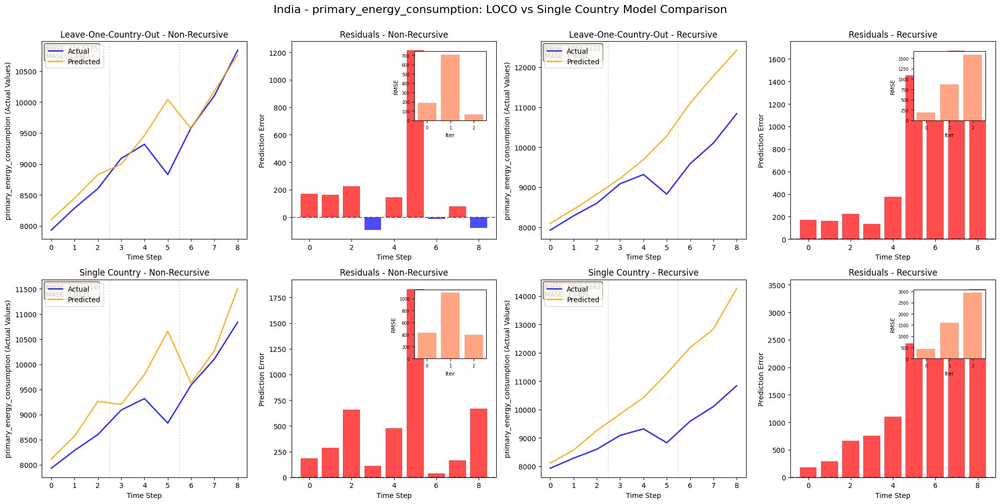

Plot saved for India

Plot comparison for Australia


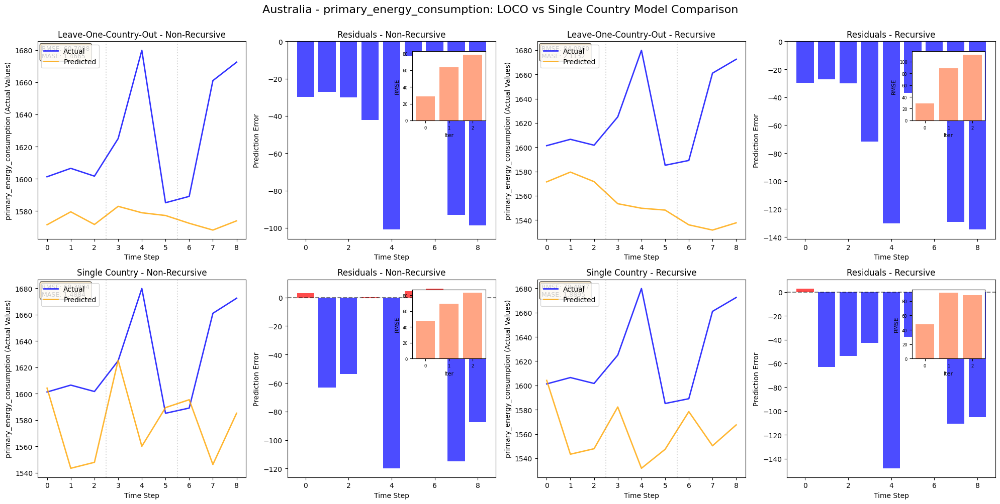

Plot saved for Australia

Plot comparison for Mexico


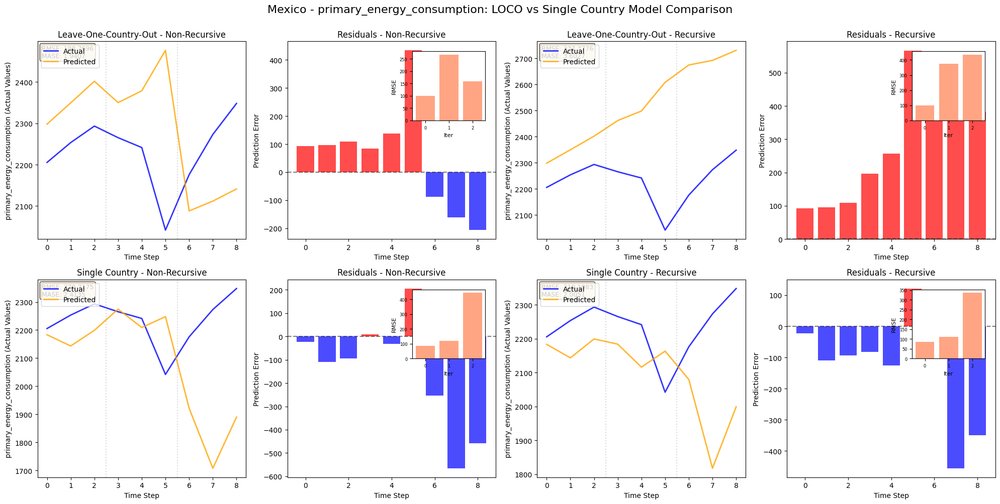

Plot saved for Mexico

Plot comparison for Indonesia


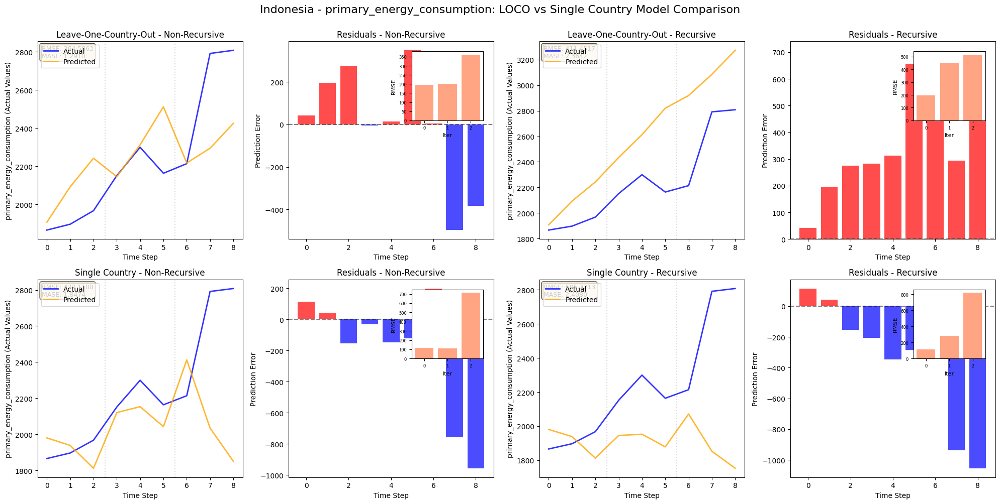

Plot saved for Indonesia

Plot comparison for Turkey


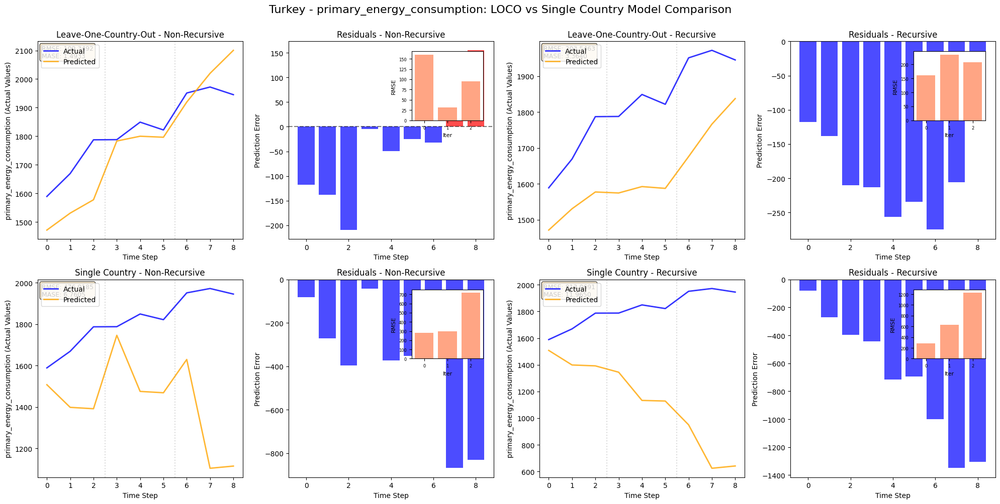

Plot saved for Turkey

Plot comparison for Saudi Arabia


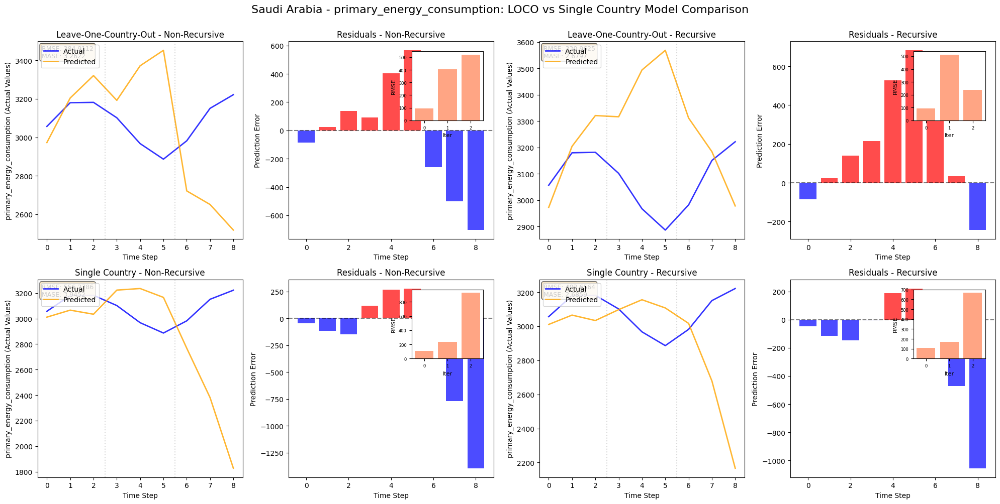

Plot saved for Saudi Arabia

Plot comparison for South Africa


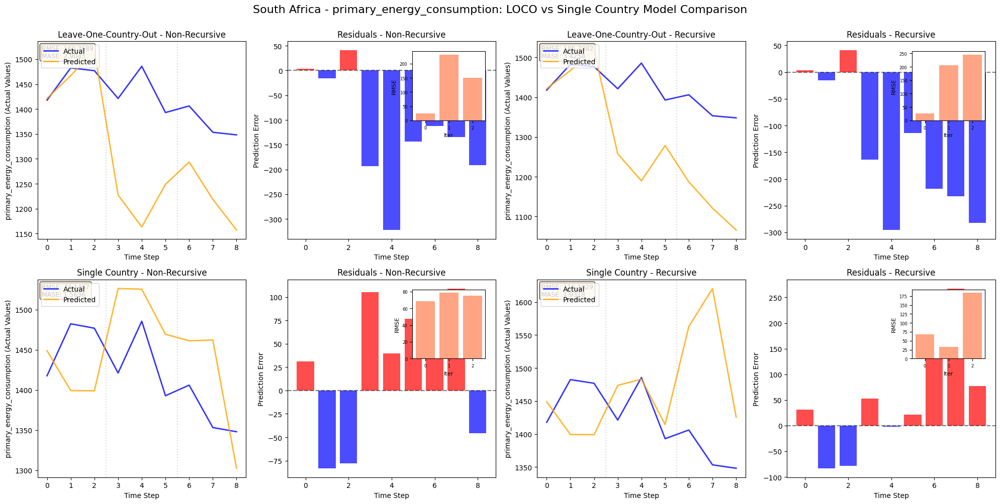

Plot saved for South Africa

Plot comparison for Argentina


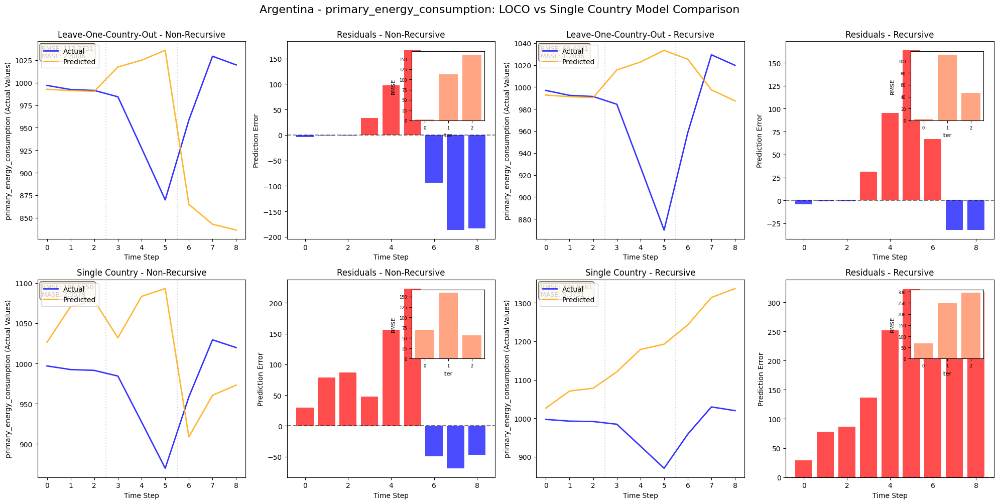

Plot saved for Argentina

Plot comparison for South Korea


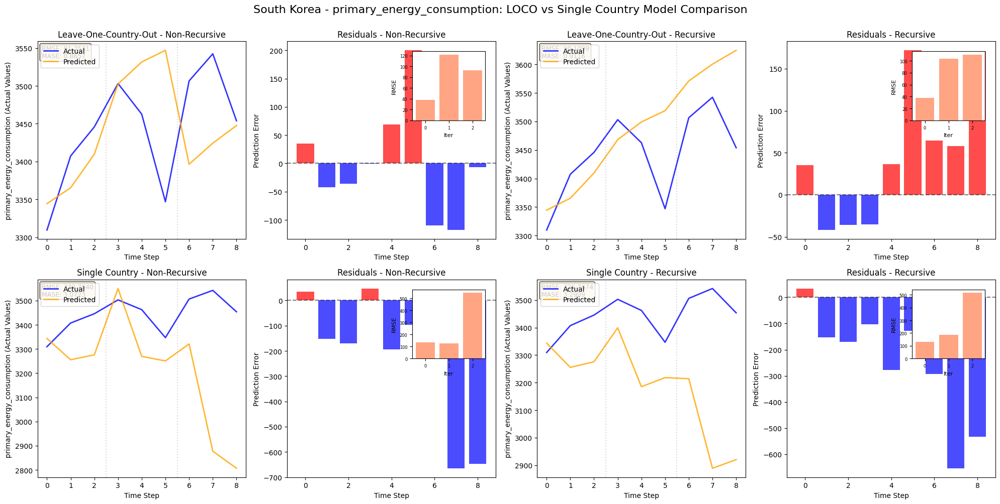

Plot saved for South Korea


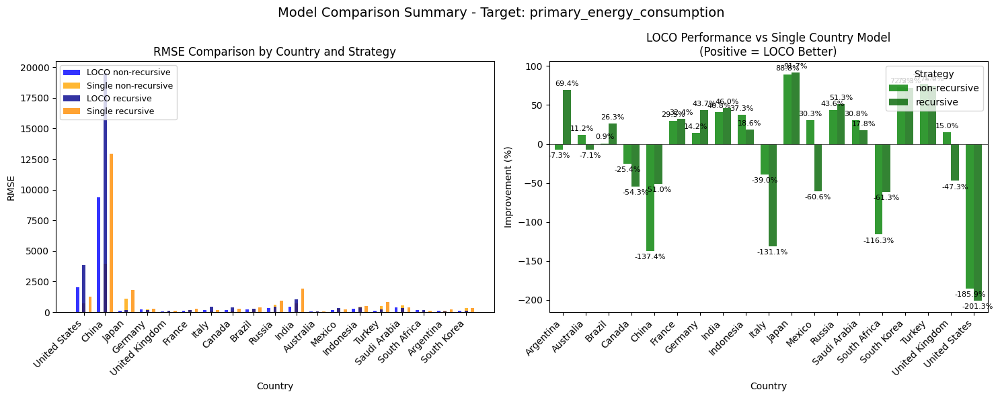

Summary plot saved
NUMERICAL SUMMARY

United States:
  non_recursive:
    LOCO RMSE:    2029.9597
    Single RMSE: 710.0862
    Improvement: -185.88%
  recursive:
    LOCO RMSE:    3868.3569
    Single RMSE: 1283.9319
    Improvement: -201.29%

China:
  non_recursive:
    LOCO RMSE:    9395.4428
    Single RMSE: 3957.3121
    Improvement: -137.42%
  recursive:
    LOCO RMSE:    19525.2321
    Single RMSE: 12933.9162
    Improvement: -50.96%

Germany:
  non_recursive:
    LOCO RMSE:    201.8604
    Single RMSE: 235.3521
    Improvement: 14.23%
  recursive:
    LOCO RMSE:    166.7248
    Single RMSE: 296.1635
    Improvement: 43.71%


({'United States': {'loco': {'non_recursive': {'predictions_pct': array([-0.04856183,  0.01225822,  0.01044142, -0.07073074,  0.00424885,
             0.00732451, -0.05356959,  0.00748591,  0.0187329 ], dtype=float32),
     'actuals_pct': array([-0.00955866, -0.00079134,  0.0037623 ,  0.03659959, -0.00711615,
            -0.07358762,  0.05418516,  0.02109183, -0.01188886]),
     'iterations': array([0, 0, 0, 1, 1, 1, 2, 2, 2]),
     'metrics':    iteration         rmse       mase
     0          0   770.504726  12.688430
     1          1  2156.317128   1.738705
     2          2  2668.113216   6.144922,
     'predictions_actual': array([24733.50342306, 25036.69096305, 25298.10963046, 23997.30425465,
            24099.26538077, 24275.77941785, 23303.6218039 , 23478.06960678,
            23917.88206341]),
     'actuals_actual': array([25747.426, 25727.051, 25823.844, 26768.986, 26578.494, 24622.646,
            25956.828, 26504.305, 26189.199])},
    'recursive': {'predictions_pct': arr

In [77]:
energy_combined_run()